### 1. Data Acquisition

In [82]:
import os
import random

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from PIL import Image
import cv2

import tensorflow as tf
from tensorflow.keras import layers, models, optimizers, Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import MobileNetV2, ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, auc, confusion_matrix, classification_report

In [74]:
# To scan the image directory and returns a dataframe
def load_image_metadata(data_dir):
    image_data = []

    for root, dirs, files in os.walk(data_dir):
        for file in files:
            if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                file_path = os.path.join(root, file)
                class_name = os.path.basename(os.path.dirname(root))

                try:
                    with Image.open(file_path) as img:
                        image_data.append({
                            'file_path': file_path,
                            'label': class_name,
                            'format': img.format,
                            'mode': img.mode,
                            'size': img.size
                        })
                except Exception as e:
                    print(f"Failed to process {file_path}: {e}")

    df = pd.DataFrame(image_data)
    
    print("\nImage formats:\n", df['format'].value_counts())
    print("\nImage modes (channels):\n", df['mode'].value_counts())
    print("\nImage size stats:\n", df['size'].value_counts().head(10))
    print(f"\nTotal images processed: {len(df)}")
    
    return df

In [75]:
data_dir = os.path.join('..', 'Dataset', 'Multicancer')
df = load_image_metadata(data_dir)


Image formats:
 format
JPEG    125002
PNG       5000
Name: count, dtype: int64

Image modes (channels):
 mode
RGB    130002
Name: count, dtype: int64

Image size stats:
 size
(512, 512)    129999
(640, 640)         3
Name: count, dtype: int64

Total images processed: 130002


## 2. Dataset Information

In [76]:
# Lets now view the labels
df['label'].value_counts()

label
Cervical Cancer          25000
Lung and Colon Cancer    25000
ALL                      20000
Brain Cancer             15000
Lymphoma                 15000
Oral Cancer              10002
Kidney Cancer            10000
Breast Cancer            10000
Name: count, dtype: int64

In [77]:
df.head()

,file_path,label,format,mode,size
0,../Dataset/Multicancer/Oral Cancer/oral_scc/or...,Oral Cancer,JPEG,RGB,"(512, 512)"
1,../Dataset/Multicancer/Oral Cancer/oral_scc/or...,Oral Cancer,JPEG,RGB,"(512, 512)"
2,../Dataset/Multicancer/Oral Cancer/oral_scc/or...,Oral Cancer,JPEG,RGB,"(512, 512)"
3,../Dataset/Multicancer/Oral Cancer/oral_scc/or...,Oral Cancer,JPEG,RGB,"(512, 512)"
4,../Dataset/Multicancer/Oral Cancer/oral_scc/or...,Oral Cancer,JPEG,RGB,"(512, 512)"


In [78]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130002 entries, 0 to 130001
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   file_path  130002 non-null  object
 1   label      130002 non-null  object
 2   format     130002 non-null  object
 3   mode       130002 non-null  object
 4   size       130002 non-null  object
dtypes: object(5)
memory usage: 5.0+ MB


In [79]:
print(f"Number of rows: {df.shape[0]}")
print(f"Number of columns: {df.shape[1]}")

Number of rows: 130002
Number of columns: 5


## 2. Exploratory Data Analysis
### 2.1 Number of Images per Cancer Type

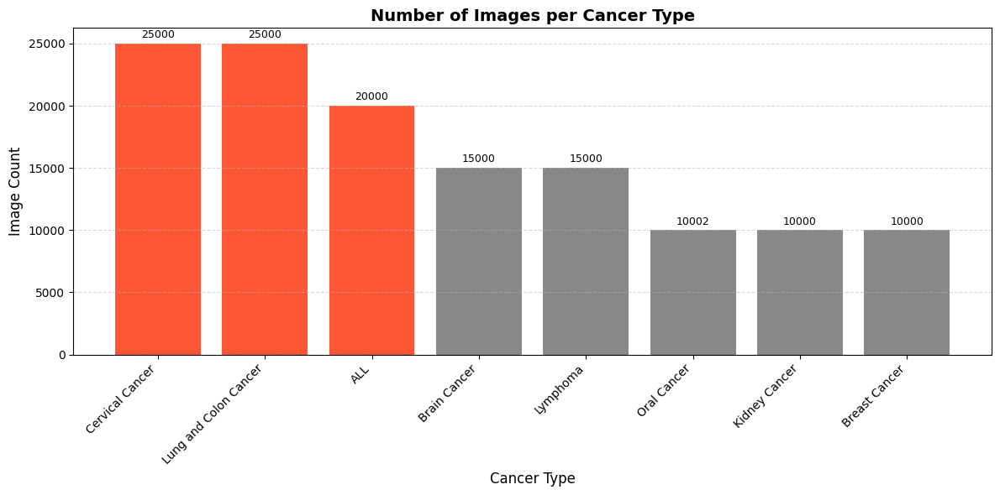

In [80]:
label_counts = df['label'].value_counts()
top_k_highlight = 3
top_labels = label_counts.head(top_k_highlight).index.tolist()

bar_color = '#888888'
top_color = '#FF5733'
colors = [top_color if label in top_labels else bar_color for label in label_counts.index]

plt.figure(figsize=(12, 6))
bars = plt.bar(label_counts.index, label_counts.values, color=colors)

plt.title('Number of Images per Cancer Type', fontsize=14, fontweight='bold')
plt.xlabel('Cancer Type', fontsize=12)
plt.ylabel('Image Count', fontsize=12)
plt.xticks(rotation=45, ha='right')

# Annotate bars with the values
for i, count in enumerate(label_counts.values):
    plt.text(i, count + max(label_counts.values) * 0.01, str(count),
             ha='center', va='bottom', fontsize=9)

plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

### 2.2 Plotting a Sample image per class

In [10]:
# TO display one sample image per class from our dataset
def plot_sample_images_per_class(df, label_col='label', path_col='file_path', max_classes=10, figsize=(15, 5)):
    classes = df[label_col].unique()[:max_classes]
    num_classes = len(classes)

    plt.figure(figsize=figsize)

    for i, class_name in enumerate(classes):
        sample_row = df[df[label_col] == class_name].iloc[0]
        try:
            img = Image.open(sample_row[path_col])
            plt.subplot(1, num_classes, i + 1)
            plt.imshow(img)
            plt.title(class_name, fontsize=10)
            plt.axis('off')
        except Exception as e:
            print(f"Error loading image for class '{class_name}': {e}")

    plt.tight_layout()
    plt.show()

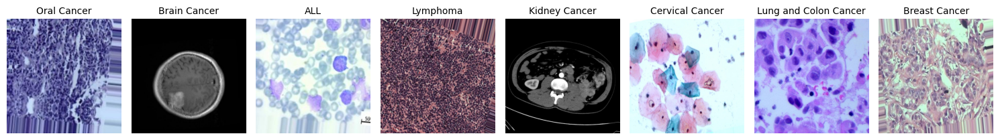

In [11]:
plot_sample_images_per_class(df)

### 2.3 Image Quality Analysis 
#### 2.3.1 Detecting Blurry Images
##### 2.3.1.1 Laplace Variance

In [12]:
def laplacian_variance(image_path):
    try:
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if image is None:
            return np.nan
        return cv2.Laplacian(image, cv2.CV_64F).var()
    except Exception as e:
        print(f"Error with {image_path}: {e}")
        return np.nan

In [13]:
# To add a column to our dataframe
def add_laplacian_variance(df, path_col='file_path', new_col='laplacian_var', verbose=True):
    tqdm.pandas()
    df[new_col] = df[path_col].progress_apply(laplacian_variance)

    if verbose:
        print(f"\nLaplacian variance stats for column '{new_col}':")
        print(df[new_col].describe())
    
    return df

In [14]:
df = add_laplacian_variance(df)

100%|██████████████████████████████████| 130002/130002 [02:42<00:00, 802.28it/s]


Laplacian variance stats for column 'laplacian_var':
count    130002.000000
mean        286.610997
std         480.825047
min           2.376581
25%          27.306039
50%          58.421544
75%         299.988301
max        6571.161275
Name: laplacian_var, dtype: float64


- **Mean (286.61)**: The mean indicates the average sharpness across the dataset. With a value around 286, on average, the images have a moderate amount of edges, meaning most images are reasonably sharp, but not extremely detailed.
- **Standard Deviation (480.82)**: A very high standard deviation suggests large variability in sharpness. Some images are extremely blurry, while others are extremely sharp, indicating inconsistency in image quality.
- **Minimum (2.37)**: The lowest Laplacian variance in the dataset is about 2.37, which is extremely low, showing that some images are almost completely blurry or lack detail.
- **25th Percentile (27.30)**: 25% of images have a variance below 27, which means one-quarter of the dataset is very blurry or low in detail.
- **Median (58.42)**: The median value of 58 indicates that half of the dataset has very low sharpness (below 58), confirming that a significant portion of images are not well-focused.
- **75th Percentile (299.99)**: 75% of the images have sharpness below ~300, meaning only the top 25% of images are highly detailed.
- **Maximum (6571.16)**: The highest variance is 6571, which is extremely sharp, possibly due to images with high texture or noise.

##### 2.3.1.2 Tenengrad Score

In [16]:
# To detect a blurry image using tenengrad, here we use a threshold 15.0
def detect_blurry_tenengrad(df, threshold=15.0, score_col='tenengrad_score', label_col='label', return_df=False):
    blurry_df = df[df[score_col] < threshold]
    total_counts = df[label_col].value_counts()
    blurry_counts = blurry_df[label_col].value_counts()

    results = []
    for label in total_counts.index:
        blurry = blurry_counts.get(label, 0)
        total = total_counts[label]
        percent = 100 * blurry / total
        results.append((label, blurry, percent))

    for label, blurry, percent in results:
        print(f"{label}: {blurry} ({percent:.2f}%)")

    if return_df:
        return blurry_df

In [17]:
def calculate_tenengrad(image_path):
    img = Image.open(image_path).convert('L')  # Convert to grayscale
    img_np = np.array(img)

    # Apply Sobel operator in x and y directions
    gx = cv2.Sobel(img_np, cv2.CV_64F, 1, 0, ksize=3)
    gy = cv2.Sobel(img_np, cv2.CV_64F, 0, 1, ksize=3)

    # Compute gradient magnitude
    magnitude = np.sqrt(gx**2 + gy**2)
    return np.mean(magnitude)

In [18]:
df['tenengrad_score'] = df['file_path'].progress_apply(calculate_tenengrad)

100%|██████████████████████████████████| 130002/130002 [04:02<00:00, 537.13it/s]


### 2.4 Detecting Blurry Images
#### 2.4.1 Detecting Blurry Images using Laplace variance

In [19]:
# To get the count and percentage of blurry images per class
def detect_blurry_images(df, threshold=300.0, var_col='laplacian_var', label_col='label', return_df=False):
    blurry_images = df[df[var_col] < threshold]
    blurry_counts = blurry_images[label_col].value_counts()
    total_counts = df[label_col].value_counts()

    for label in blurry_counts.index:
        count = blurry_counts[label]
        total = total_counts[label]
        percent = (count / total) * 100
        print(f"{label}: {count} ({percent:.2f}%)")

    if return_df:
        return blurry_images

In [20]:
df['laplacian_var'].describe()

count    130002.000000
mean        286.610997
std         480.825047
min           2.376581
25%          27.306039
50%          58.421544
75%         299.988301
max        6571.161275
Name: laplacian_var, dtype: float64

I based it on the distribution summary: the median Laplacian variance is ~58, and 75% of your images are below 300. So, a threshold of 300 is too high—it classifies most images as blurry. A range of 100–150 is a better balance between under- and over-detection. 

In [21]:
# This function prints blurry images per class and get the filtered DataFrame
blurry_df = detect_blurry_images(df, threshold=125, return_df=True)

Cervical Cancer: 24172 (96.69%)
ALL: 20000 (100.00%)
Lung and Colon Cancer: 16621 (66.48%)
Brain Cancer: 14977 (99.85%)
Oral Cancer: 7064 (70.63%)
Breast Cancer: 4003 (40.03%)


For a Threshold = 300.0 and using the Entire Dataset
- We notice a label imbalance in quality. Some classes (like Kidney Cancer or Breast Cancer) have far fewer blurry samples than others. This could introduce a bias in the model
- ALL and Brain Cancer have 100% blurry images, we can check out some of these images directly and see if they actually are blurry


For a Threshold = 125 and using the entire dataset
- At 125, most images in Brain Cancer and ALL are still classified as blurry (near 100%), indicating these might genuinely be low-variance images or require revisiting their quality.
- Classes like Breast Cancer (40%) and Lung and Colon Cancer (66%) have fewer blurry images, showing more variability in sharpness.

This made us realise that maybe we should use different thresholds based on the Class Label, because some thresholds might be too high for some labels

In [22]:
def get_classwise_thresholds(df, label_col='label', var_col='laplacian_var', quantile=0.25):
    thresholds = df.groupby(label_col)[var_col].quantile(quantile).to_dict()
    return thresholds


def flag_blurry_classwise(df, thresholds, label_col='label', var_col='laplacian_var'):
    def is_blurry(row):
        thresh = thresholds.get(row[label_col], None)
        if thresh is None:
            return False
        return row[var_col] < thresh

    df['is_blurry'] = df.apply(is_blurry, axis=1)
    return df

In [23]:
# TO visualize images near the blur threshold
def visualize_borderline_blur(df, class_name, method='laplacian', thresholds=None, 
                              label_col='label', path_col='file_path', margin=10, 
                              num_samples=3):
    var_col = {
        'laplacian': 'laplacian_var',
        'tenengrad': 'tenengrad_score'
    }.get(method)

    if var_col is None:
        raise ValueError("Method must be 'laplacian' or 'tenengrad'.")

    if thresholds is None or class_name not in thresholds:
        print(f"No threshold found for class '{class_name}' using method '{method}'")
        return

    thresh = thresholds[class_name]
    subset = df[(df[label_col] == class_name) & 
                (df[var_col] >= thresh - margin) & 
                (df[var_col] <= thresh + margin)]

    samples = subset.sample(n=min(num_samples, len(subset)), random_state=42)

    plt.figure(figsize=(15, 5))
    for i, row in enumerate(samples.itertuples(), 1):
        img = Image.open(getattr(row, path_col))
        plt.subplot(1, num_samples, i)
        plt.imshow(img)
        plt.title(f"{class_name}\n{method.capitalize()}: {getattr(row, var_col):.1f}")
        plt.axis('off')
    plt.show()

In [24]:
thresholds = get_classwise_thresholds(df, quantile=0.25)
df = flag_blurry_classwise(df, thresholds)

# Check blurry counts per class
print(df.groupby('label')['is_blurry'].mean() * 100)  # % blurry per class

label
ALL                      25.000000
Brain Cancer             25.000000
Breast Cancer            25.000000
Cervical Cancer          25.000000
Kidney Cancer            25.000000
Lung and Colon Cancer    25.000000
Lymphoma                 25.000000
Oral Cancer              25.004999
Name: is_blurry, dtype: float64


Our function flagged 25% of each class label as blurry, now we should check if these are actualy blurry

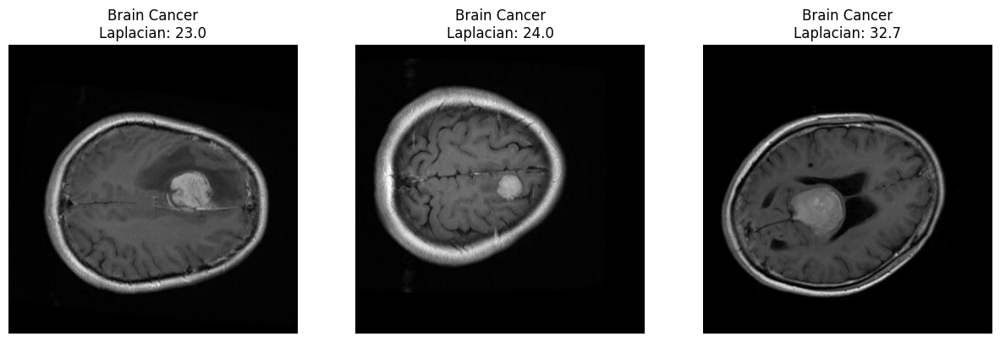

In [25]:
# Using the 5th percentile ensures we flag only the lowest 5% of images in sharpness per class,
# helping us catch the most blurry ones without being too aggressive or misclassifying borderline images.
laplace_thresholds = df.groupby('label')['laplacian_var'].quantile(0.05).to_dict()

visualize_borderline_blur(df, 'Brain Cancer', method='laplacian', thresholds=laplace_thresholds)

#### 2.4.2 Detecting Blurry Images using Tenengrad Score

In [26]:
blurry_images_ten = detect_blurry_tenengrad(df, threshold=15, return_df=True)

Cervical Cancer: 3199 (12.80%)
Lung and Colon Cancer: 16 (0.06%)
ALL: 542 (2.71%)
Brain Cancer: 241 (1.61%)
Lymphoma: 0 (0.00%)
Oral Cancer: 61 (0.61%)
Kidney Cancer: 0 (0.00%)
Breast Cancer: 5 (0.05%)


- Cervical Cancer has a significantly higher proportion of blurry images (12.8%)—this might indicate poor quality in that subset.
- Most other classes (e.g., Lung, Brain, Breast) show very low blur rates (<2%), which aligns with your visual observations that many of these images appear clear.
- Lymphoma and Kidney Cancer: 0% blurry—strong indication that the images in these classes are consistently sharp based on Tenengrad

**Tenengrad is doing a better job avoiding false positives.**



We use the 5th percentile threshold to flag the lowest sharpness scores in each class, capturing the most visibly blurry 5% of images. This helps balance between removing clearly blurry samples without being too strict.



In [27]:
tenengrad_thresholds = df.groupby('label')['tenengrad_score'].quantile(0.05).to_dict()

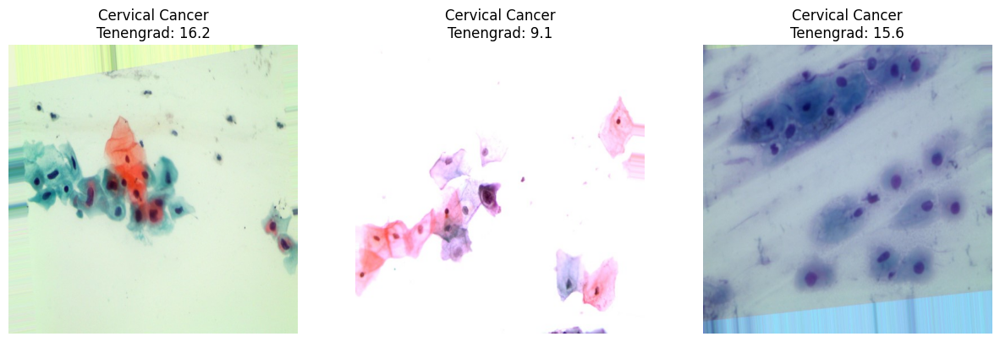

In [28]:
visualize_borderline_blur(
    df,
    class_name='Cervical Cancer',
    method='tenengrad',
    thresholds=tenengrad_thresholds
)

In [29]:
def analyze_tenengrad_distribution(df, thresholds, label_col='label', score_col='tenengrad_score'):
    class_labels = df[label_col].unique()

    for label in class_labels:
        subset = df[df[label_col] == label]
        scores = subset[score_col]
        threshold = thresholds[label]

        # Print stats
        below = (scores < threshold).sum()
        above = (scores >= threshold).sum()
        print(f"\nClass: {label}")
        print(f"Threshold (5th percentile): {threshold:.2f}")
        print(f"Images below threshold: {below}")
        print(f"Images above threshold: {above}")

        # Plot histogram
        plt.figure(figsize=(8, 4))
        plt.hist(scores, bins=30, color='skyblue', edgecolor='black')
        plt.axvline(threshold, color='red', linestyle='--', label=f'Threshold: {threshold:.2f}')
        plt.title(f"Tenengrad Score Distribution - {label}")
        plt.xlabel("Tenengrad Score")
        plt.ylabel("Image Count")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()


Class: Oral Cancer
Threshold (5th percentile): 27.00
Images below threshold: 501
Images above threshold: 9501


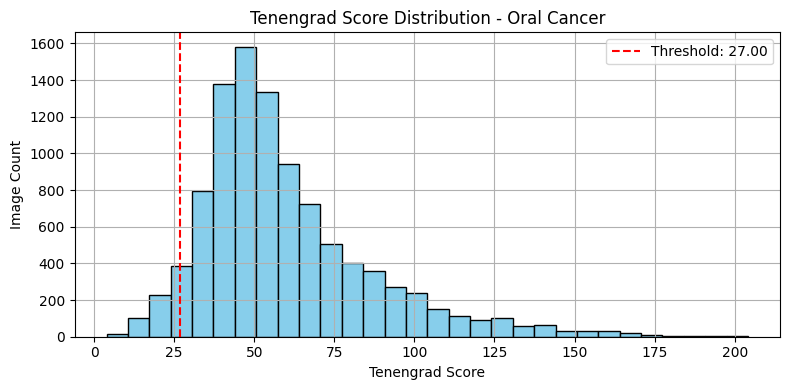


Class: Brain Cancer
Threshold (5th percentile): 17.61
Images below threshold: 750
Images above threshold: 14250


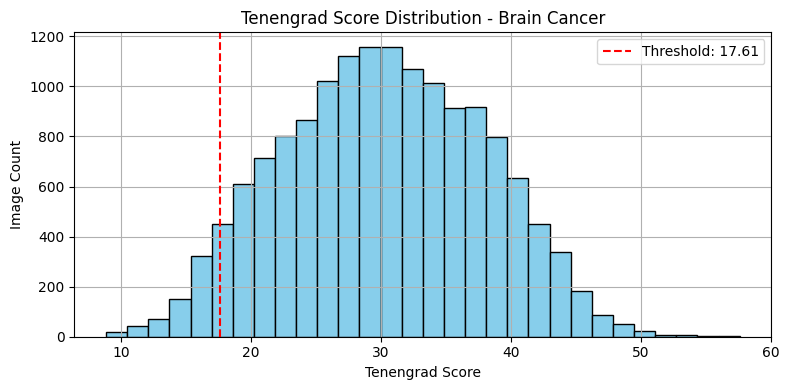


Class: ALL
Threshold (5th percentile): 17.17
Images below threshold: 1000
Images above threshold: 19000


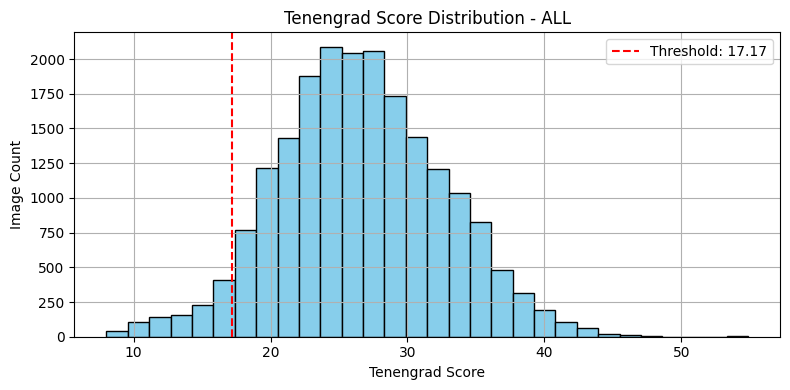


Class: Lymphoma
Threshold (5th percentile): 111.03
Images below threshold: 750
Images above threshold: 14250


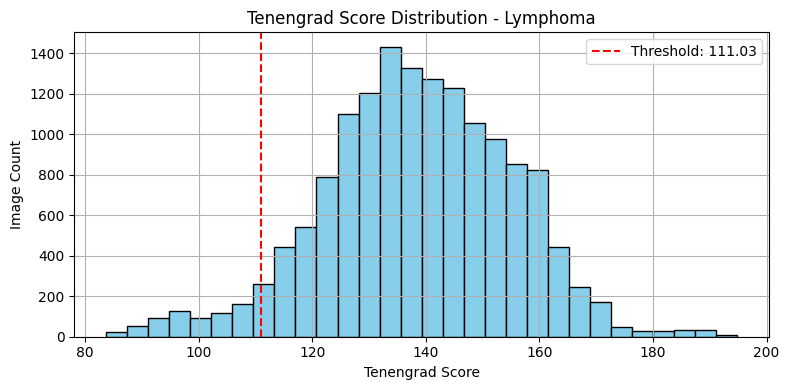


Class: Kidney Cancer
Threshold (5th percentile): 33.93
Images below threshold: 500
Images above threshold: 9500


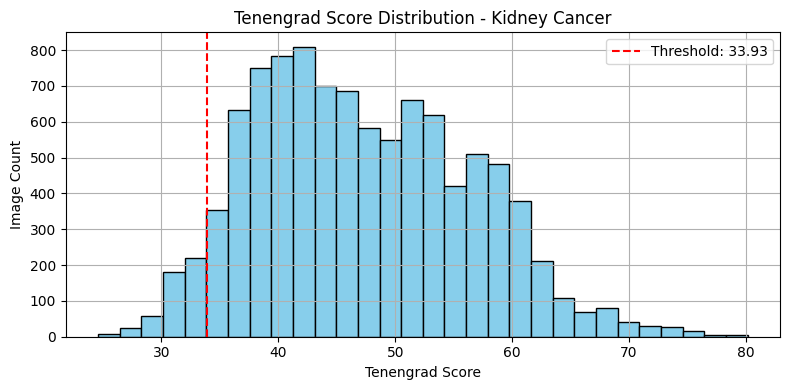


Class: Cervical Cancer
Threshold (5th percentile): 10.98
Images below threshold: 1250
Images above threshold: 23750


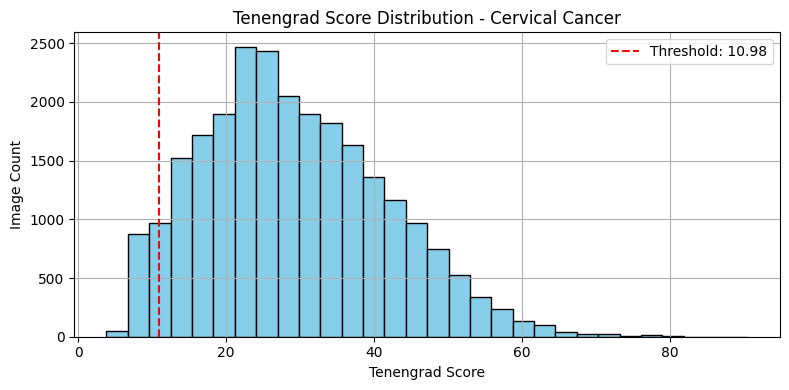


Class: Lung and Colon Cancer
Threshold (5th percentile): 26.19
Images below threshold: 1250
Images above threshold: 23750


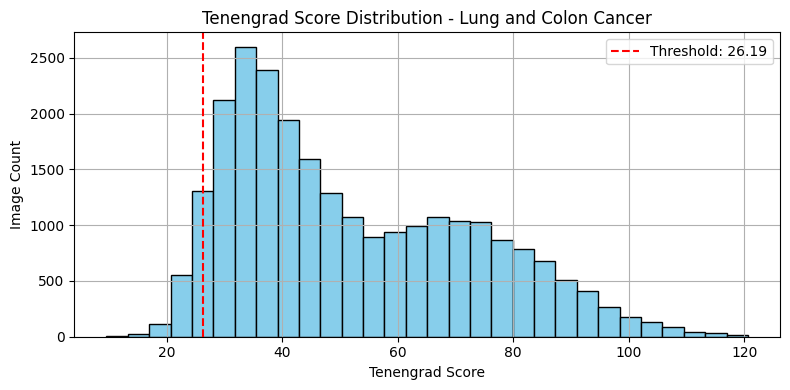


Class: Breast Cancer
Threshold (5th percentile): 30.73
Images below threshold: 500
Images above threshold: 9500


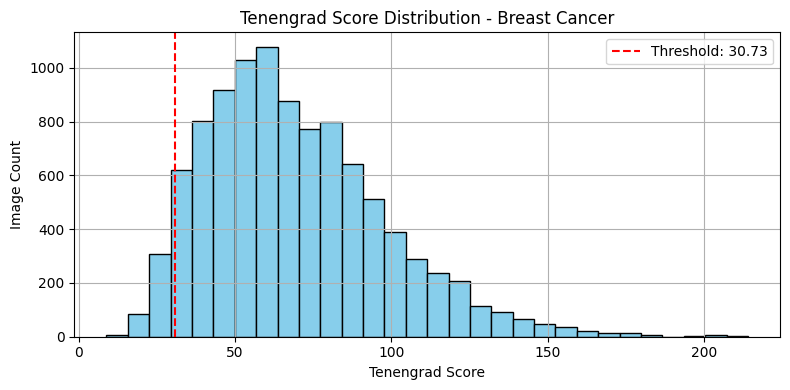

In [30]:
analyze_tenengrad_distribution(df, tenengrad_thresholds)

From the above histogram we can clearly see the exact tenengrad score threshold for each label and the number of images below and above the threshold

**Now lets visualize the images whose tenengrad score is greater than the thresholds**


Visualizing borderline blurry images for: Oral Cancer


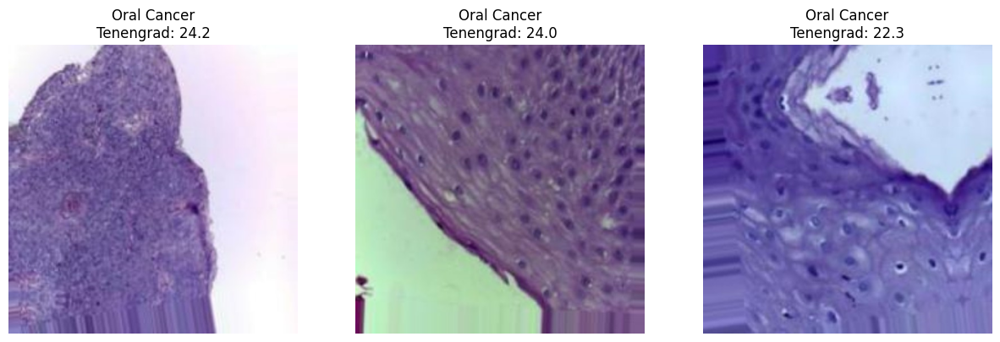


Visualizing borderline blurry images for: Brain Cancer


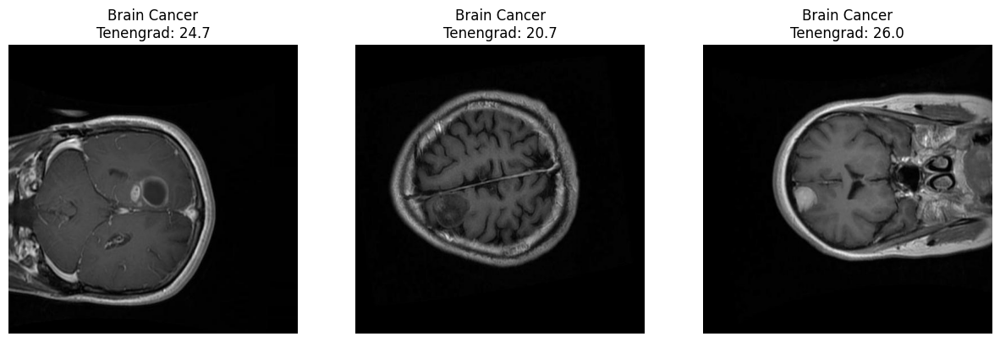


Visualizing borderline blurry images for: ALL


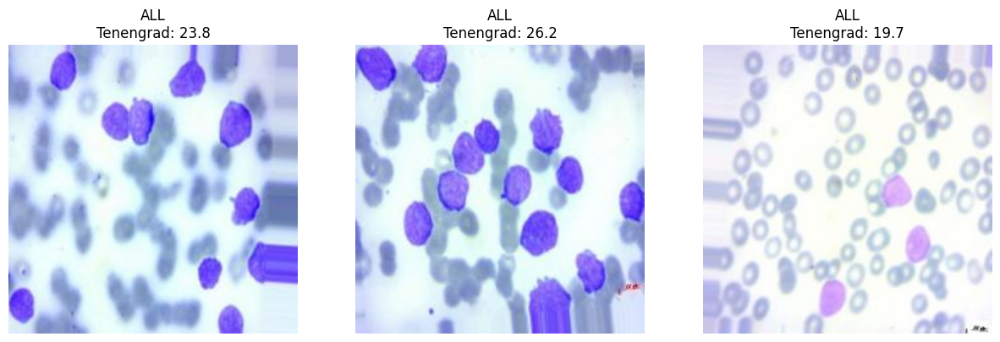


Visualizing borderline blurry images for: Lymphoma


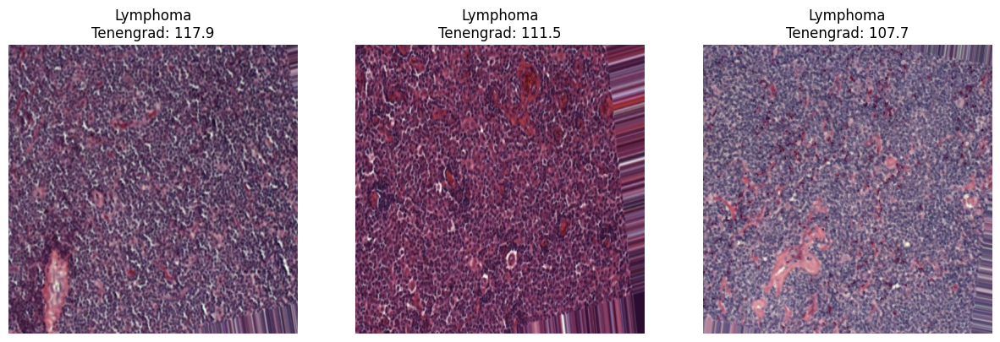


Visualizing borderline blurry images for: Kidney Cancer


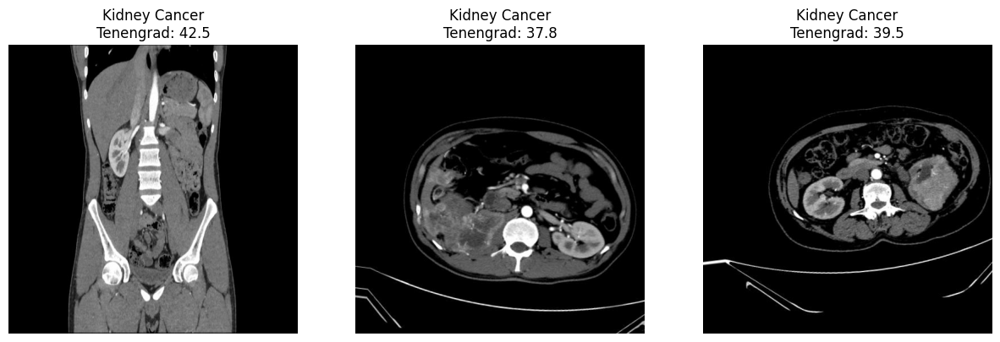


Visualizing borderline blurry images for: Cervical Cancer


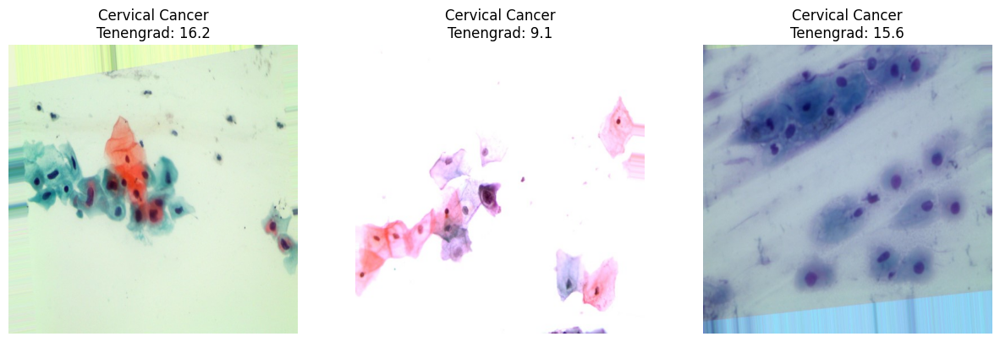


Visualizing borderline blurry images for: Lung and Colon Cancer


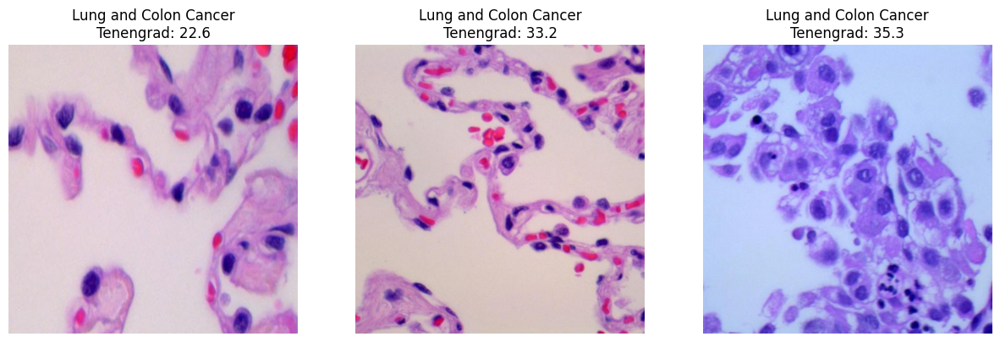


Visualizing borderline blurry images for: Breast Cancer


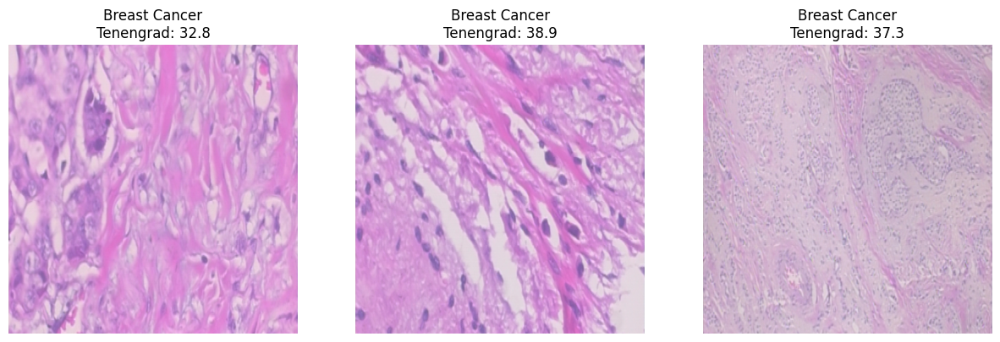

In [31]:
# List of class names in your dataset
class_names = df['label'].unique()

# Choose method and thresholds
method = 'tenengrad'  # or 'laplacian'
thresholds = tenengrad_thresholds  

# Visualize borderline images for each class
for class_name in class_names:
    print(f"\nVisualizing borderline blurry images for: {class_name}")
    visualize_borderline_blur(
        df,
        class_name=class_name,
        method=method,
        thresholds=thresholds,
        margin=10,
        num_samples=3
    )

### 2.5 Brightness and Contrast

In [32]:
def analyze_image_quality(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        return np.nan, np.nan
    
    # Calculate brightness as the mean pixel intensity
    brightness = np.mean(img)
    
    # Calculate contrast as the standard deviation of pixel intensity
    contrast = np.std(img)
    
    return brightness, contrast

In [33]:
# Adding brightness and contrast features
def add_brightness_contrast_features(df, path_col='file_path', brightness_col='brightness', contrast_col='contrast', verbose=True):
    tqdm.pandas(desc="Analyzing image brightness & contrast")
    
    df[[brightness_col, contrast_col]] = df[path_col].progress_apply(
        lambda path: pd.Series(analyze_image_quality(path))
    )

    if verbose:
        print(f"\n{brightness_col} stats:")
        print(df[brightness_col].describe())
        print(f"\n{contrast_col} stats:")
        print(df[contrast_col].describe())

    return df

In [34]:
df = add_brightness_contrast_features(df)

Analyzing image brightness & contrast: 100%|█| 130002/130002 [02:27<00:00, 881.8


brightness stats:
count    130002.000000
mean        140.138706
std          62.306102
min          11.147572
25%          93.764463
50%         152.921124
75%         192.237732
max         252.665497
Name: brightness, dtype: float64

contrast stats:
count    130002.000000
mean         40.704131
std          11.523274
min           7.603450
25%          33.237135
50%          39.659739
75%          46.813958
max          92.776730
Name: contrast, dtype: float64


#### Brightness Insights

| Metric   | Value | Interpretation                                                                                  |
| -------- | ----- | ----------------------------------------------------------------------------------------------- |
| **Mean** | \~140 | Slightly above the mid-point (128) of grayscale \[0–255] — images tend to be moderately bright. |
| **Min**  | \~11  | Some images are very dark and may lack visible detail.                                          |
| **25%**  | \~94  | 25% of your images are relatively dim, potential candidates for enhancement.                    |
| **75%**  | \~192 | The brightest quartile — could skew attention if not normalized.                                |


#### Contrast Insights
| Metric   | Value  | Interpretation                                                                                |
| -------- | ------ | --------------------------------------------------------------------------------------------- |
| **Mean** | \~41   | Typical for medical images — some variation, but not extremely low                            |
| **Min**  | \~7.6  | Very low contrast images exist — possibly hard to interpret or blurry                         |
| **25%**  | \~33   | Could signal soft-tissue or fuzzy images — may benefit from sharpening or contrast adjustment |
| **Max**  | \~92.8 | High contrast outliers — may dominate model attention if not normalized                       |


#### 2.5.1 Visualizing Brightness and Contrast Distribution

In [35]:
def plot_brightness_contrast_by_class(df, label_col='label', brightness_col='brightness', contrast_col='contrast', top_n_classes=None):
    if top_n_classes is not None:
        top_classes = df[label_col].value_counts().nlargest(top_n_classes).index
        df = df[df[label_col].isin(top_classes)]

    # Plot Brightness
    plt.figure(figsize=(10, 5))
    for label in df[label_col].unique():
        temp = df[df[label_col] == label]
        plt.hist(temp[brightness_col].dropna(), bins=30, alpha=0.5, label=label)
    plt.title('Brightness Distribution per Class')
    plt.xlabel('Brightness')
    plt.ylabel('Image Count')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Plot Contrast
    plt.figure(figsize=(10, 5))
    for label in df[label_col].unique():
        temp = df[df[label_col] == label]
        plt.hist(temp[contrast_col].dropna(), bins=30, alpha=0.5, label=label)
    plt.title('Contrast Distribution per Class')
    plt.xlabel('Contrast')
    plt.ylabel('Image Count')
    plt.legend()
    plt.tight_layout()
    plt.show()

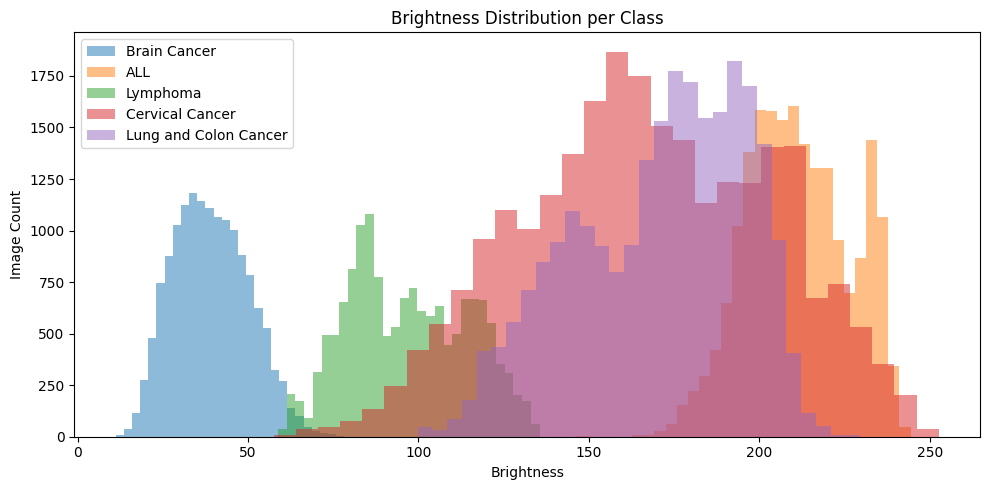

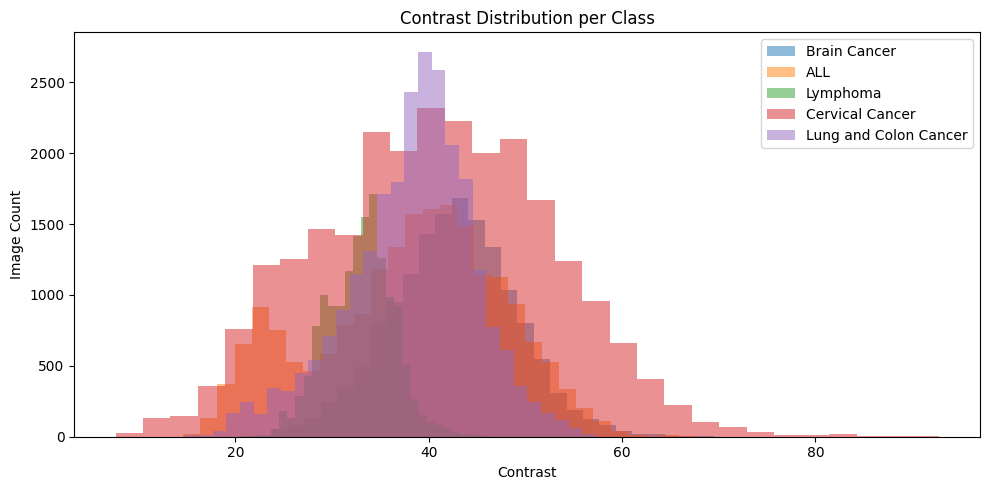

In [36]:
plot_brightness_contrast_by_class(df, top_n_classes=5)

#### 2.5.2 Plotting Blurry VS Sharp Images using Laplace Variance

In [37]:
def plot_blurry_vs_sharp_samples_laplace(df, label, label_col='label', var_col='laplacian_var', path_col='file_path',
                                 threshold=300.0, num_samples=3, figsize=(12, 6)):
    df_label = df[df[label_col] == label]

    blurry_samples = df_label[df_label[var_col] < threshold].head(num_samples)
    sharp_samples = df_label[df_label[var_col] > threshold].head(num_samples)

    plt.figure(figsize=figsize)

    for i, row in enumerate(blurry_samples.itertuples(), 1):
        try:
            img = Image.open(getattr(row, path_col))
            plt.subplot(2, num_samples, i)
            plt.imshow(img)
            plt.title(f"Blurry ({getattr(row, var_col):.1f})")
            plt.axis('off')
        except Exception as e:
            print(f"Error loading blurry image: {e}")

    for i, row in enumerate(sharp_samples.itertuples(), 1):
        try:
            img = Image.open(getattr(row, path_col))
            plt.subplot(2, num_samples, i + num_samples)
            plt.imshow(img)
            plt.title(f"Sharp ({getattr(row, var_col):.1f})")
            plt.axis('off')
        except Exception as e:
            print(f"Error loading sharp image: {e}")

    plt.tight_layout()
    plt.show()

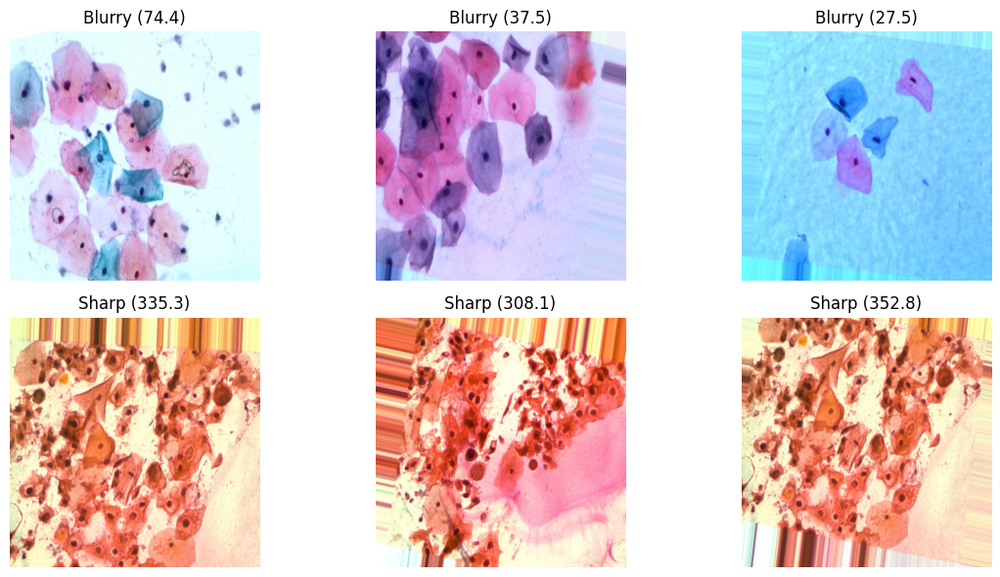

In [38]:
plot_blurry_vs_sharp_samples_laplace(df, label='Cervical Cancer', label_col='label')

#### 2.5.3 Plotting Blurry vs Sharp Images based on tenengrad

In [39]:
def plot_blurry_vs_sharp_samples_tenengrad(df, label, label_col='label', var_col='tenengrad_var', path_col='file_path',
                                           threshold=15.0, num_samples=3, figsize=(12, 6)):
    df_label = df[df[label_col] == label]

    blurry_samples = df_label[df_label[var_col] < threshold].head(num_samples)
    sharp_samples = df_label[df_label[var_col] >= threshold].head(num_samples)

    plt.figure(figsize=figsize)

    for i, row in enumerate(blurry_samples.itertuples(), 1):
        try:
            img = Image.open(getattr(row, path_col))
            plt.subplot(2, num_samples, i)
            plt.imshow(img)
            plt.title(f"Blurry ({getattr(row, var_col):.1f})")
            plt.axis('off')
        except Exception as e:
            print(f"Error loading blurry image: {e}")

    for i, row in enumerate(sharp_samples.itertuples(), 1):
        try:
            img = Image.open(getattr(row, path_col))
            plt.subplot(2, num_samples, i + num_samples)
            plt.imshow(img)
            plt.title(f"Sharp ({getattr(row, var_col):.1f})")
            plt.axis('off')
        except Exception as e:
            print(f"Error loading sharp image: {e}")

    plt.tight_layout()
    plt.show()

In [40]:
df.columns

Index(['file_path', 'label', 'format', 'mode', 'size', 'laplacian_var',
       'tenengrad_score', 'is_blurry', 'brightness', 'contrast'],
      dtype='object')

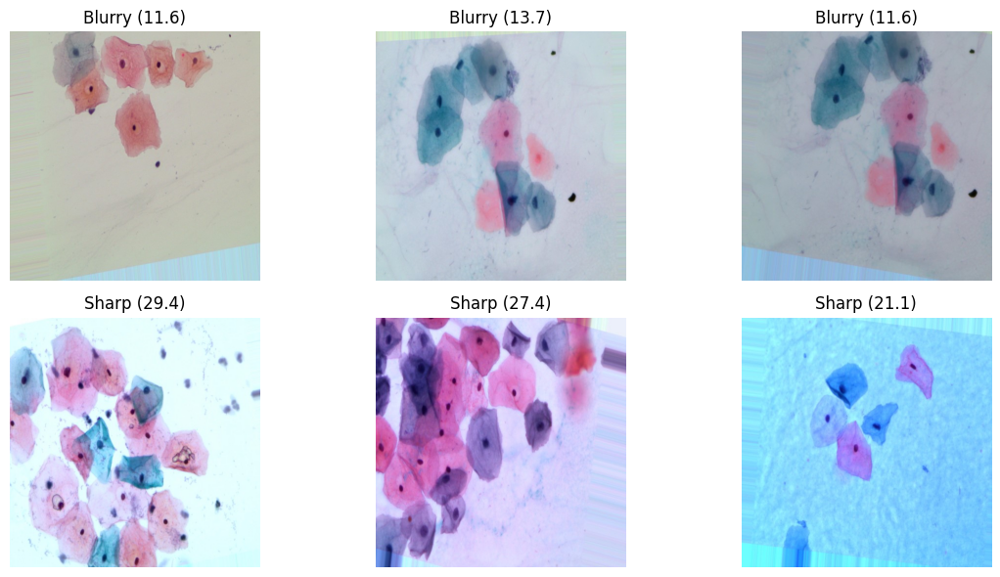

In [41]:
plot_blurry_vs_sharp_samples_tenengrad(df, label='Cervical Cancer', label_col='label', var_col='tenengrad_score', threshold=15.0)

### 2.6 Outlier Detection
#### 2.6.1 Plotting the outliers in a box plot

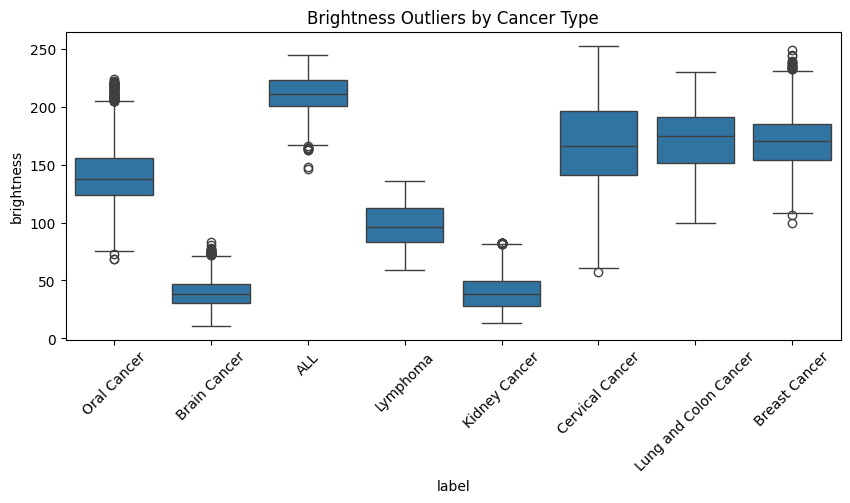

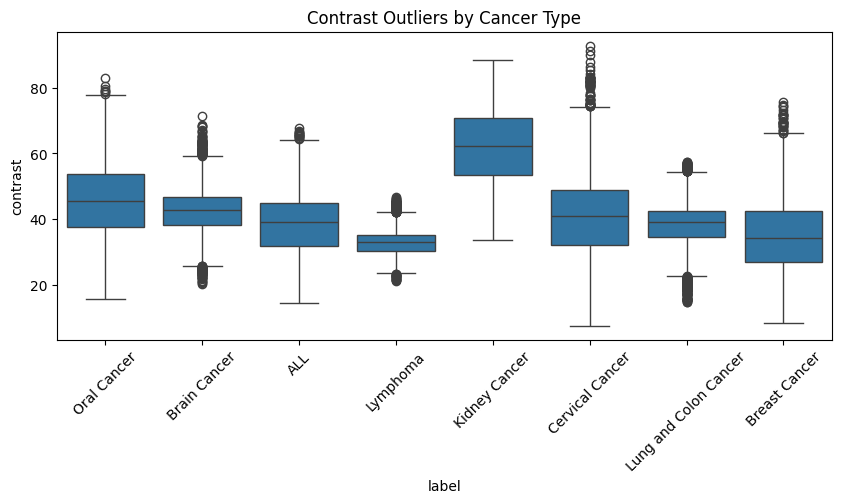

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns

# Boxplot for brightness
plt.figure(figsize=(10, 4))
sns.boxplot(data=df, x='label', y='brightness')
plt.title('Brightness Outliers by Cancer Type')
plt.xticks(rotation=45)
plt.show()

# Boxplot for contrast
plt.figure(figsize=(10, 4))
sns.boxplot(data=df, x='label', y='contrast')
plt.title('Contrast Outliers by Cancer Type')
plt.xticks(rotation=45)
plt.show()

In [43]:
# Now lets remove these outliers using the IQR Method
def remove_outliers_iqr_grouped(df, column):
    def iqr_filter(group):
        Q1 = group[column].quantile(0.25)
        Q3 = group[column].quantile(0.75)
        IQR = Q3 - Q1
        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR
        return group[(group[column] >= lower) & (group[column] <= upper)]
    
    return df.groupby('label', group_keys=False).apply(iqr_filter)

In [44]:
# Now lets remove the outliers based on brightness and contrast
df = remove_outliers_iqr_grouped(df, 'brightness')
df = remove_outliers_iqr_grouped(df, 'contrast')

/var/folders/rb/nphnyzc1317dyz8jd5bl5z_80000gn/T/ipykernel_53061/1839190763.py:11: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby('label', group_keys=False).apply(iqr_filter)
/var/folders/rb/nphnyzc1317dyz8jd5bl5z_80000gn/T/ipykernel_53061/1839190763.py:11: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return df.groupby('label', group_keys=False).apply(iqr_filter)


### 2.7 Creating a Stratified Sample of the data
The below functions maintains the proportion of the classes present in our data, we do this so its easier and faster to run our models

In [81]:
def stratified_sample(df, label_col='label', sample_size=None, sample_frac=None, random_state=70):
    if (sample_size is None and sample_frac is None) or (sample_size is not None and sample_frac is not None):
        raise ValueError("Specify exactly one of sample_size or sample_frac.")

    # Calculate the fraction per class in original dataset
    class_counts = df[label_col].value_counts(normalize=True)

    if sample_size:
        # Number of samples per class proportional to original distribution
        samples_per_class = (class_counts * sample_size).round().astype(int)
    else:  # sample_frac is specified
        samples_per_class = (class_counts * len(df) * sample_frac).round().astype(int)

    sampled_dfs = []
    for cls, n_samples in samples_per_class.items():
        cls_df = df[df[label_col] == cls]
        # Handle case where class size < n_samples by taking all
        n_samples = min(n_samples, len(cls_df))
        sampled = cls_df.sample(n=n_samples, random_state=random_state)
        sampled_dfs.append(sampled)

    sampled_df = pd.concat(sampled_dfs).sample(frac=1, random_state=random_state).reset_index(drop=True)
    return sampled_df

### 2.8 Working with Stratified Sample of the Data

In [47]:
df1 = stratified_sample(df, sample_size=5000)

In [48]:
df1['label'].value_counts()

label
Cervical Cancer          968
Lung and Colon Cancer    946
ALL                      775
Lymphoma                 578
Brain Cancer             574
Kidney Cancer            387
Breast Cancer            386
Oral Cancer              385
Name: count, dtype: int64

In [49]:
df1.shape

(4999, 10)

In [51]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4999 entries, 0 to 4998
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   file_path        4999 non-null   object 
 1   label            4999 non-null   object 
 2   format           4999 non-null   object 
 3   mode             4999 non-null   object 
 4   size             4999 non-null   object 
 5   laplacian_var    4999 non-null   float64
 6   tenengrad_score  4999 non-null   float64
 7   is_blurry        4999 non-null   bool   
 8   brightness       4999 non-null   float64
 9   contrast         4999 non-null   float64
dtypes: bool(1), float64(4), object(5)
memory usage: 356.5+ KB


In [53]:
# Blurry images in df1 with Laplace
blurry_df1 = detect_blurry_images(df1, threshold=300.0, return_df=True)

Cervical Cancer: 962 (99.38%)
Lung and Colon Cancer: 813 (85.94%)
ALL: 775 (100.00%)
Brain Cancer: 574 (100.00%)
Oral Cancer: 300 (77.92%)
Breast Cancer: 295 (76.42%)
Kidney Cancer: 31 (8.01%)


In [54]:
# Detecting Blurry Images with Tenengrad
blurry_images_ten = detect_blurry_tenengrad(df1, threshold=15, return_df=True)

Cervical Cancer: 123 (12.71%)
Lung and Colon Cancer: 1 (0.11%)
ALL: 19 (2.45%)
Lymphoma: 0 (0.00%)
Brain Cancer: 10 (1.74%)
Kidney Cancer: 0 (0.00%)
Breast Cancer: 0 (0.00%)
Oral Cancer: 4 (1.04%)


In [55]:
df1['is_blurry'].value_counts()

is_blurry
False    3758
True     1241
Name: count, dtype: int64

## 3. Model Building
Creating functions so we can call and run the models multiple times

In [61]:
import os
import random
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.applications import MobileNetV2, ResNet50
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers, models, Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout

In [62]:
# So we can reproduce the same results
def set_seeds(seed=42):
    import tensorflow as tf, numpy as np, random
    tf.random.set_seed(seed)
    np.random.seed(seed)
    random.seed(seed)

### 3.1 Function to create image generators
- Splits data into train, validation, and test sets with stratified sampling.
- Ensures no file overlap between splits to prevent data leakage.
- Applies optional augmentation to training data (rescaling, rotation, shifts, flips).
- Creates ImageDataGenerators for train, val, and test sets with appropriate preprocessing.
- Returns generators and class-to-index mapping.

In [63]:
# Creates train, validation, and test ImageDataGenerators with optional augmentation and safety checks.
def create_image_generators(
    df, 
    image_size=(224, 224), 
    batch_size=32, 
    test_size=0.2, 
    val_size=0.1, 
    augment=False, 
    verbose=True
):

    # Split into train+val and test
    df_trainval, df_test = train_test_split(
        df,
        test_size=test_size,
        stratify=df['label'],
        random_state=42
    )

    # Spliting into train and val
    df_train, df_val = train_test_split(
        df_trainval,
        test_size=val_size,
        stratify=df_trainval['label'],
        random_state=42
    )

    # Checking for data leakage
    intersection_tv = set(df_train['file_path']) & set(df_val['file_path'])
    intersection_tt = set(df_train['file_path']) & set(df_test['file_path'])
    intersection_vt = set(df_val['file_path']) & set(df_test['file_path'])

    assert len(intersection_tv) == 0, f"Data leakage between TRAIN and VAL sets: {intersection_tv}"
    assert len(intersection_tt) == 0, f"Data leakage between TRAIN and TEST sets: {intersection_tt}"
    assert len(intersection_vt) == 0, f"Data leakage between VAL and TEST sets: {intersection_vt}"

    # Defining the data generators
    if augment:
        train_datagen = ImageDataGenerator(
            rescale=1./255,
            rotation_range=15,
            width_shift_range=0.1,
            height_shift_range=0.1,
            horizontal_flip=True
        )
    else:
        train_datagen = ImageDataGenerator(rescale=1./255)

    test_val_datagen = ImageDataGenerator(rescale=1./255)

    # Creating generators
    train_gen = train_datagen.flow_from_dataframe(
        dataframe=df_train,
        x_col='file_path',
        y_col='label',
        target_size=image_size,
        batch_size=batch_size,
        class_mode='sparse',
        shuffle=True
    )

    val_gen = test_val_datagen.flow_from_dataframe(
        dataframe=df_val,
        x_col='file_path',
        y_col='label',
        target_size=image_size,
        batch_size=batch_size,
        class_mode='sparse',
        shuffle=False
    )

    test_gen = test_val_datagen.flow_from_dataframe(
        dataframe=df_test,
        x_col='file_path',
        y_col='label',
        target_size=image_size,
        batch_size=batch_size,
        class_mode='sparse',
        shuffle=False
    )

    # Log summary
    if verbose:
        print(f"Image generators created successfully!")
        print(f"Train: {len(train_gen.filenames)} images")
        print(f"Val:   {len(val_gen.filenames)} images")
        print(f"Test:  {len(test_gen.filenames)} images")

    # Return everything
    return train_gen, val_gen, test_gen, train_gen.class_indices

### 3.2 Building CNN Model Function
- Includes two Conv2D layers with 3x3 kernels and ReLU activation.
- Each convolutional layer is optionally followed by Batch Normalization.
- MaxPooling2D layers reduce spatial dimensions after each convolution.
- Adds a dense layer with 128 units and ReLU activation.
- Applies dropout (default 0.5) for regularization after the dense layer.
- Ends with a softmax output layer for multi-class classification.

In [64]:
def build_cnn_model(input_shape, num_classes, use_batch_norm=True, dropout_rate=0.5):
    model = Sequential()

    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    if use_batch_norm: model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D(2, 2))

    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    if use_batch_norm: model.add(layers.BatchNormalization())
    model.add(layers.MaxPooling2D(2, 2))

    model.add(layers.Flatten())
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dropout(dropout_rate))
    model.add(layers.Dense(num_classes, activation='softmax'))

    return model

### 3.3 Function to Build Transfer Model
- Loads a pretrained base model (e.g., MobileNet, ResNet) without its top classification layer.
- Optionally freezes or makes the base model trainable.
- Adds global average pooling to reduce feature maps to a vector.
- Adds a dense layer with 128 units (ReLU) and dropout for regularization.
- Ends with a softmax output layer for multi-class classification.
- Returns the assembled transfer learning model.

In [65]:
def build_transfer_model(base_model_class, input_shape, num_classes, base_trainable=True, dropout_rate=0.5):
    base_model = base_model_class(include_top=False, weights='imagenet', input_shape=input_shape)
    base_model.trainable = base_trainable

    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(128, activation='relu'),
        Dropout(dropout_rate),
        Dense(num_classes, activation='softmax')
    ])
    return model

### 3.4 Train Pipeline Function
- Selects model architecture based on model_type:
   - cnn → Builds a custom CNN with optional Batch Normalization (BN).<br>
   - mobilenetv2 or resnet50 → Builds a transfer learning model with pretrained ImageNet weights.

In [66]:
def train_pipeline(model_type,
                   input_shape,
                   num_classes,
                   train_gen,
                   val_gen,
                   epochs=10,
                   base_trainable=True,
                   use_batch_norm=True,
                   early_stop=True,
                   learning_rate=1e-4,
                   dropout_rate=0.5,
                   class_weights=None):  # Handles imbalance

    if model_type == 'cnn':
        model = build_cnn_model(input_shape, num_classes, use_batch_norm, dropout_rate)
    elif model_type == 'mobilenetv2':
        model = build_transfer_model(MobileNetV2, input_shape, num_classes, base_trainable, dropout_rate)
    elif model_type == 'resnet50':
        model = build_transfer_model(ResNet50, input_shape, num_classes, base_trainable, dropout_rate)
    else:
        raise ValueError(f"Unsupported model_type: {model_type}")

    model.compile(
        optimizer=Adam(learning_rate=learning_rate),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    callbacks = []
    if early_stop:
        callbacks.append(EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True))

    history = model.fit(
        train_gen,
        validation_data=val_gen,
        epochs=epochs,
        callbacks=callbacks,
        class_weight=class_weights,  
        verbose=1
    )

    return model, history

### 3.5 Evaluate Model function

In [67]:
def evaluate_model(model, test_gen):
    print("\nEvaluating Model...")
    loss, acc = model.evaluate(test_gen, verbose=0)
    print(f"Test Accuracy: {acc:.4f} | Test Loss: {loss:.4f}")

### 3.6 Run all Models Function
Sets a seed for reproducibility, prepares a results dictionary, and ensures a saved_models directory exists. Sequentially trains and evaluates a custom CNN, MobileNetV2, and ResNet50 via train_pipeline, optionally using class weights. Saves each model in .keras format, logs training histories, and returns all models and metrics for later analysis.

In [68]:
def run_all_models(train_gen, val_gen, test_gen,
                   input_shape,
                   num_classes,
                   epochs=10,
                   seed=72,
                   base_trainable_resnet=True,
                   base_trainable_mobilenet=False,
                   class_weights=None,
                   model_name="default"):  

    set_seeds(seed)
    results = {}

    os.makedirs("saved_models", exist_ok=True)

    print("Training CNN:")
    cnn_model, cnn_history = train_pipeline(
        'cnn', input_shape, num_classes,
        train_gen, val_gen, epochs,
        class_weights=class_weights
    )
    evaluate_model(cnn_model, test_gen)
    cnn_model.save(f"saved_models/CNN_{model_name}.keras")
    results['cnn'] = (cnn_model, cnn_history)

    print("\nTraining MobileNetV2:")
    mobilenet_model, mobilenet_history = train_pipeline(
        'mobilenetv2', input_shape, num_classes,
        train_gen, val_gen, epochs,
        base_trainable=base_trainable_mobilenet,
        class_weights=class_weights
    )
    evaluate_model(mobilenet_model, test_gen)
    mobilenet_model.save(f"saved_models/mobileNet_{model_name}.keras")
    results['mobilenetv2'] = (mobilenet_model, mobilenet_history)

    print("\nTraining ResNet50:")
    resnet_model, resnet_history = train_pipeline(
        'resnet50', input_shape, num_classes,
        train_gen, val_gen, epochs,
        base_trainable=base_trainable_resnet,
        class_weights=class_weights
    )
    evaluate_model(resnet_model, test_gen)
    resnet_model.save(f"saved_models/resnet50_{model_name}.keras")
    results['resnet50'] = (resnet_model, resnet_history)

    return results

## 4. Evaluation Metrics Functions
### 4.1 Classification Report

In [69]:
def get_classification_reports(models, test_gen, target_names):
    for name, model in models.items():
        print(f"\nClassification Report for {name}:\n{'-'*40}")
        # Predict labels for test set
        y_pred_probs = model.predict(test_gen)
        y_pred = np.argmax(y_pred_probs, axis=1)
        y_true = test_gen.classes  # True labels from the generator
        
        # Generate classification report
        report = classification_report(y_true, y_pred, target_names=target_names)
        print(report)

### 4.2 Confusion Matrix

In [70]:
def plot_confusion_matrices(models, test_gen, target_names):
    for model_name, model in models.items():
        print(f"\nConfusion Matrix for {model_name}:")

        # Get true labels and predictions
        y_true = test_gen.classes
        y_pred_probs = model.predict(test_gen)
        y_pred = np.argmax(y_pred_probs, axis=1)

        # Compute confusion matrix
        cm = confusion_matrix(y_true, y_pred)

        plt.figure(figsize=(10, 8))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=target_names,
                    yticklabels=target_names)
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.title(f'Confusion Matrix - {model_name}')
        plt.show()

### 4.3 Accuracy and Loss Curves

In [71]:
def plot_training_histories(histories, model_names):
    plt.figure(figsize=(18, 6))

    # Accuracy subplot
    plt.subplot(1, 2, 1)
    for history, name in zip(histories, model_names):
        plt.plot(history['accuracy'], label=f'{name} Train Acc')
        plt.plot(history['val_accuracy'], label=f'{name} Val Acc')
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss subplot
    plt.subplot(1, 2, 2)
    for history, name in zip(histories, model_names):
        plt.plot(history['loss'], label=f'{name} Train Loss')
        plt.plot(history['val_loss'], label=f'{name} Val Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

### 4.4 AUC-ROC Curve

In [72]:
def plot_auc_roc(models, test_gen, model_names):
    y_true = test_gen.classes
    num_classes = len(test_gen.class_indices)  
    y_true_onehot = tf.keras.utils.to_categorical(y_true, num_classes=num_classes)
    
    plt.figure(figsize=(8, 6))

    for model, name in zip(models, model_names):
        y_pred_prob = model.predict(test_gen)
        
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
        
        for i in range(num_classes):
            fpr[i], tpr[i], _ = roc_curve(y_true_onehot[:, i], y_pred_prob[:, i])
            roc_auc[i] = auc(fpr[i], tpr[i])
        
        # Micro-average ROC curve
        fpr["micro"], tpr["micro"], _ = roc_curve(y_true_onehot.ravel(), y_pred_prob.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
        
        plt.plot(fpr["micro"], tpr["micro"], label=f'{name} (AUC = {roc_auc["micro"]:.3f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.title('Micro-average ROC Curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

## 5. MODEL TRAINING
### 5.1 Model Training - 1
- Training model on a small sample of the data (5000 Records)
- No Data Augmentation
- Not handling Class Imbalance

In [69]:
train_gen, val_gen, test_gen, class_indices = create_image_generators(
    df=df1,
    image_size=(224, 224),
    augment=False  # disables augmentation
)

Found 3599 validated image filenames belonging to 8 classes.
Found 400 validated image filenames belonging to 8 classes.
Found 1000 validated image filenames belonging to 8 classes.
Image generators created successfully!
Train: 3599 images
Val:   400 images
Test:  1000 images


In [70]:
results = run_all_models(
    train_gen=train_gen,
    val_gen=val_gen,
    test_gen=test_gen,
    input_shape=(224, 224, 3),
    num_classes=len(class_indices),  # Automatically inferred
    epochs=10,
    model_name = 'Model1_SmallSample'
)

Training CNN:


/Users/daivik/Projects/MultiCancer-Kaggle/venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2025-08-08 00:53:55.943911: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3
2025-08-08 00:53:55.943989: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 24.00 GB
2025-08-08 00:53:55.943999: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 8.00 GB
2025-08-08 00:53:55.944063: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2025-08-08 00:53:55.944080: I tensorflow/core/common_runtime/pluggable_device/plugga

Epoch 1/10


2025-08-08 00:53:56.428337: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


113/113 ━━━━━━━━━━━━━━━━━━━━ 25s 216ms/step - accuracy: 0.6361 - loss: 12.2379 - val_accuracy: 0.3675 - val_loss: 7.3071
Epoch 2/10
113/113 ━━━━━━━━━━━━━━━━━━━━ 25s 218ms/step - accuracy: 0.8152 - loss: 12.6570 - val_accuracy: 0.5825 - val_loss: 12.9911
Epoch 3/10
113/113 ━━━━━━━━━━━━━━━━━━━━ 24s 215ms/step - accuracy: 0.8257 - loss: 15.8923 - val_accuracy: 0.7225 - val_loss: 19.6707
Epoch 4/10
113/113 ━━━━━━━━━━━━━━━━━━━━ 25s 216ms/step - accuracy: 0.8665 - loss: 14.5880 - val_accuracy: 0.7600 - val_loss: 21.1765

Evaluating Model...
Test Accuracy: 0.3550 | Test Loss: 7.1743

Training MobileNetV2:
Epoch 1/10
113/113 ━━━━━━━━━━━━━━━━━━━━ 16s 127ms/step - accuracy: 0.3513 - loss: 2.0807 - val_accuracy: 0.8900 - val_loss: 0.3691
Epoch 2/10
113/113 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - accuracy: 0.7918 - loss: 0.6543 - val_accuracy: 0.9300 - val_loss: 0.2061
Epoch 3/10
113/113 ━━━━━━━━━━━━━━━━━━━━ 13s 115ms/step - accuracy: 0.8804 - loss: 0.3552 - val_accuracy: 0.9450 - val_loss: 0.1575
E

### 5.1.1 Model Training Summary 1
| Model       | Input Shape   | Base Model Used | Frozen Layers | Trainable Layers | Params Used                     | Final Train Accuracy | Final Val Accuracy | Test Accuracy | Test Loss |
| ----------- | ------------- | --------------- | ------------- | ---------------- | ------------------------------- | -------------------- | ------------------ | ------------- | --------- |
| CNN        | (224, 224, 3) | None            | N/A           | All              | Default (small custom CNN)      | 86.65%               | 76.00%             | 35.50%        | 7.1743    |
| MobileNetV2 | (224, 224, 3) | MobileNetV2     | Yes (partial) | Custom Top Layer | Pretrained, lightweight         | 96.91%               | 96.75%             | 97.90%        | 0.0680    |
| ResNet50    | (224, 224, 3) | ResNet50        | Yes (initial) | Custom Top Layer | Pretrained, deeper architecture | 99.93%               | 99.25%             | 99.80%        | 0.0133    |

- CNN is heavily overfitting (huge gap between train/val vs test accuracy).
- MobileNetV2 generalizes well, showing strong val/test performance with fast training.
- ResNet50 performs the best, though it's much heavier and trains slowly — suitable for final deployment, not rapid prototyping.

#### 5.1.2 Classification Report

In [71]:
target_names = list(train_gen.class_indices.keys())

models = {
    'CNN': results['cnn'][0],
    'MobileNetV2': results['mobilenetv2'][0],
    'ResNet50': results['resnet50'][0]
}

# Replace target_names with your actual class labels list
get_classification_reports(models, test_gen, target_names)


Classification Report for CNN:
----------------------------------------
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step
                       precision    recall  f1-score   support

                  ALL       0.00      0.00      0.00       155
         Brain Cancer       0.29      1.00      0.45       115
        Breast Cancer       0.12      0.05      0.07        77
      Cervical Cancer       1.00      0.14      0.24       194
        Kidney Cancer       0.00      0.00      0.00        77
Lung and Colon Cancer       0.36      1.00      0.53       189
             Lymphoma       1.00      0.13      0.23       116
          Oral Cancer       0.71      0.06      0.12        77

             accuracy                           0.35      1000
            macro avg       0.44      0.30      0.21      1000
         weighted avg       0.48      0.35      0.24      1000


Classification Report for MobileNetV2:
----------------------------------------


/Users/daivik/Projects/MultiCancer-Kaggle/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/daivik/Projects/MultiCancer-Kaggle/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
/Users/daivik/Projects/MultiCancer-Kaggle/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _war

32/32 ━━━━━━━━━━━━━━━━━━━━ 7s 183ms/step
                       precision    recall  f1-score   support

                  ALL       1.00      1.00      1.00       155
         Brain Cancer       1.00      1.00      1.00       115
        Breast Cancer       0.93      0.90      0.91        77
      Cervical Cancer       0.99      0.99      0.99       194
        Kidney Cancer       1.00      1.00      1.00        77
Lung and Colon Cancer       0.98      0.97      0.97       189
             Lymphoma       0.98      1.00      0.99       116
          Oral Cancer       0.89      0.92      0.90        77

             accuracy                           0.98      1000
            macro avg       0.97      0.97      0.97      1000
         weighted avg       0.98      0.98      0.98      1000


Classification Report for ResNet50:
----------------------------------------
32/32 ━━━━━━━━━━━━━━━━━━━━ 13s 338ms/step
                       precision    recall  f1-score   support

                

**CNN:** Predicts mainly Brain Cancer and Lung & Colon Cancer (recall = 1.00); several classes never predicted (precision/recall = 0.00).

**MobileNetV2:** All metrics > 0.9 across classes; minor dip for Oral Cancer (precision = 0.89); strong even with small data.

**ResNet50:** Near-perfect scores for all classes; possible slight overfitting on small test set.

#### 5.1.3 Accuracy and Loss Curve

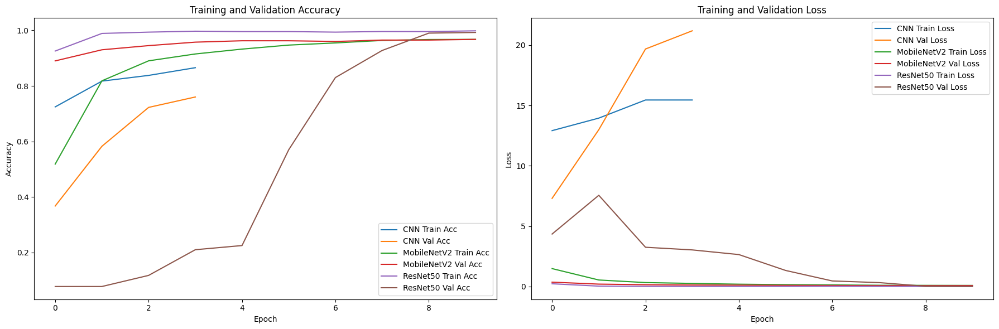

In [73]:
histories = [
    results['cnn'][1].history,
    results['mobilenetv2'][1].history,
    results['resnet50'][1].history
]

model_names = ['CNN', 'MobileNetV2', 'ResNet50']

plot_training_histories(histories, model_names)

ResNet50 outperforms all models, reaching ~99% accuracy early with flat, minimal loss, indicating strong convergence. MobileNetV2 also excels, surpassing 95% accuracy with stable, declining loss. In contrast, CNN shows a wide train–val gap, high and fluctuating validation loss, and erratic curves, suggesting poor generalization and instability.


#### 5.1.4 AUC - ROC Curve

32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 126ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 9s 278ms/step


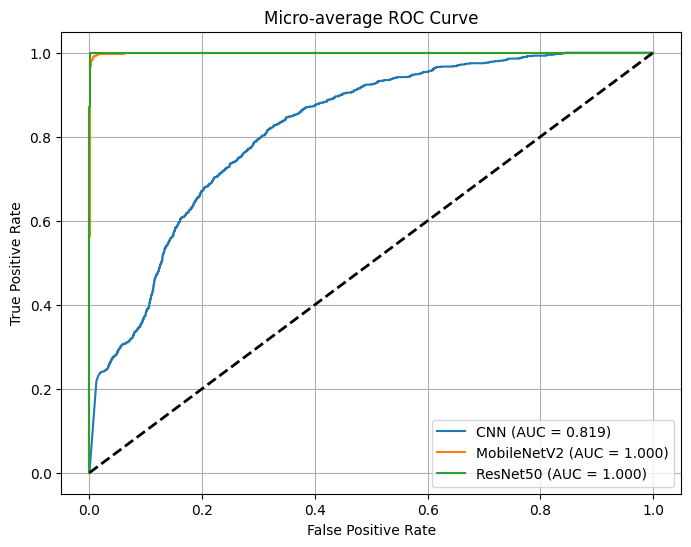

In [74]:
models = [results['cnn'][0], results['mobilenetv2'][0], results['resnet50'][0]]
model_names = ['CNN', 'MobileNetV2', 'ResNet50']

plot_auc_roc(models, test_gen, model_names)

From this ROC curve:

- CNN (AUC = 0.819): Moderate classification ability; still better than random guessing, but much less effective than the other models.
- MobileNetV2 (AUC = 1.000): Perfect separation between classes — highly accurate, though results may be suspiciously perfect in real-world contexts.
- ResNet50 (AUC = 1.000): Also perfect classification performance, matching MobileNetV2, which again could indicate possible overfitting or data leakage.


### 5.2 Model 2 - Larger Sample Size
- Without Augmentation but Larger subset of the data
- Not handling Class Imbalance

In [75]:
df1 = stratified_sample(df, sample_size=75000)

In [76]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split

def create_image_generators(dataframe, image_size=(224, 224), batch_size=32, test_size=0.2, val_size=0.1, augment=False):
    # Split into train+val and test
    df_trainval, df_test = train_test_split(
        dataframe,
        test_size=test_size,
        stratify=dataframe['label'],
        random_state=72
    )

    # Split trainval into train and val
    df_train, df_val = train_test_split(
        df_trainval,
        test_size=val_size,
        stratify=df_trainval['label'],
        random_state=72
    )

    # Create ImageDataGenerators
    if augment:
        train_datagen = ImageDataGenerator(
            rescale=1./255,
            rotation_range=15,
            width_shift_range=0.1,
            height_shift_range=0.1,
            horizontal_flip=True
        )
    else:
        train_datagen = ImageDataGenerator(rescale=1./255)

    val_test_datagen = ImageDataGenerator(rescale=1./255)

    # Create generators
    train_gen = train_datagen.flow_from_dataframe(
        dataframe=df_train,
        x_col='file_path',
        y_col='label',
        target_size=image_size,
        batch_size=batch_size,
        class_mode='sparse'
    )

    val_gen = val_test_datagen.flow_from_dataframe(
        dataframe=df_val,
        x_col='file_path',
        y_col='label',
        target_size=image_size,
        batch_size=batch_size,
        class_mode='sparse'
    )

    test_gen = val_test_datagen.flow_from_dataframe(
        dataframe=df_test,
        x_col='file_path',
        y_col='label',
        target_size=image_size,
        batch_size=batch_size,
        class_mode='sparse',
        shuffle=False
    )

    # Return all 4 outputs
    return train_gen, val_gen, test_gen, train_gen.class_indices


In [77]:
train_gen, val_gen, test_gen, class_indices = create_image_generators(
    df1,
    image_size=(224, 224),
    batch_size=32,
    test_size=0.2,
    val_size=0.1,
    augment=False
)

Found 54000 validated image filenames belonging to 8 classes.
Found 6000 validated image filenames belonging to 8 classes.
Found 15000 validated image filenames belonging to 8 classes.


In [78]:
results = run_all_models(
    train_gen=train_gen,
    val_gen=val_gen,
    test_gen=test_gen,
    input_shape=(224, 224, 3),
    num_classes=len(class_indices),
    epochs=10,
    model_name = 'LargerSample'
)

Training CNN:


/Users/daivik/Projects/MultiCancer-Kaggle/venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/Users/daivik/Projects/MultiCancer-Kaggle/venv/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 442s 261ms/step - accuracy: 0.8169 - loss: 15.6558 - val_accuracy: 0.9620 - val_loss: 9.5694
Epoch 2/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 450s 267ms/step - accuracy: 0.9459 - loss: 12.9694 - val_accuracy: 0.9868 - val_loss: 3.8170
Epoch 3/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 433s 257ms/step - accuracy: 0.9643 - loss: 11.4653 - val_accuracy: 0.9928 - val_loss: 1.6146
Epoch 4/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 407s 241ms/step - accuracy: 0.9755 - loss: 9.2886 - val_accuracy: 0.9897 - val_loss: 2.4816
Epoch 5/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 424s 251ms/step - accuracy: 0.9791 - loss: 7.8195 - val_accuracy: 0.9920 - val_loss: 3.1885
Epoch 6/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 403s 239ms/step - accuracy: 0.9816 - loss: 7.9392 - val_accuracy: 0.9898 - val_loss: 3.7950

Evaluating Model...
Test Accuracy: 0.9919 | Test Loss: 1.8041

Training MobileNetV2:
Epoch 1/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 270s 159ms/step - accuracy: 0.8013 - loss: 0.6265 - val_accuracy:

**From these results for Model Run 2 (no augmentation, 75k images):**
- CNN → Accuracy steadily improves from ~82% to ~99% on validation, but loss remains much higher for val/test compared to training. This means it’s learning the patterns well but predicting with lower confidence on unseen data.
- MobileNetV2 → Rapid accuracy jump in first epoch (~80% → ~98%), then smooth climb to ~99.7%. Loss drops sharply and stays consistently low across train and validation — a sign of stable, healthy learning.
- ResNet50 → Accuracy almost perfect after just a couple of epochs, with near-zero loss. The curve is too good to be true — points strongly toward memorization or leakage rather than natural learning progression.

#### 5.2.1 Classification Report

In [79]:
target_names = list(train_gen.class_indices.keys())

models = {
    'CNN': results['cnn'][0],
    'MobileNetV2': results['mobilenetv2'][0],
    'ResNet50': results['resnet50'][0]
}

# Replace target_names with your actual class labels list
get_classification_reports(models, test_gen, target_names)


Classification Report for CNN:
----------------------------------------
469/469 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step
                       precision    recall  f1-score   support

                  ALL       1.00      1.00      1.00      2326
         Brain Cancer       1.00      1.00      1.00      1723
        Breast Cancer       0.97      0.98      0.98      1159
      Cervical Cancer       1.00      0.97      0.99      2904
        Kidney Cancer       1.00      1.00      1.00      1162
Lung and Colon Cancer       0.99      1.00      0.99      2837
             Lymphoma       1.00      1.00      1.00      1734
          Oral Cancer       0.96      0.99      0.97      1155

             accuracy                           0.99     15000
            macro avg       0.99      0.99      0.99     15000
         weighted avg       0.99      0.99      0.99     15000


Classification Report for MobileNetV2:
----------------------------------------
469/469 ━━━━━━━━━━━━━━━━━━━━ 56s 118ms/step


- CNN → Macro F1 ≈ 0.99, excellent across most classes. Slightly weaker for Breast Cancer (0.98) and Oral Cancer (0.97), indicating they’re still harder to classify.
- MobileNetV2 → Macro F1 = 1.00 or very close for all classes. Consistently strong and balanced performance.
- ResNet50 → Perfect 1.00 precision, recall, and F1 for every class — highly suspicious and almost certainly due to leakage or memorization.


#### 5.2.2 Confusion Matrix


Confusion Matrix for CNN:
469/469 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step


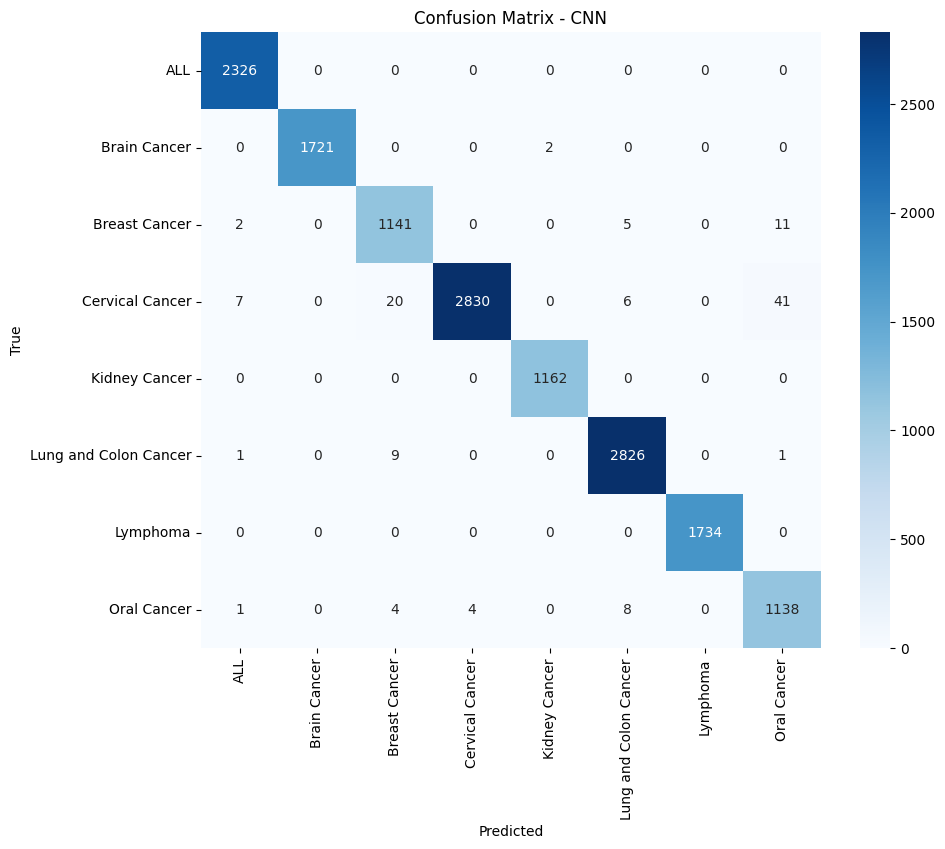


Confusion Matrix for MobileNetV2:
469/469 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step


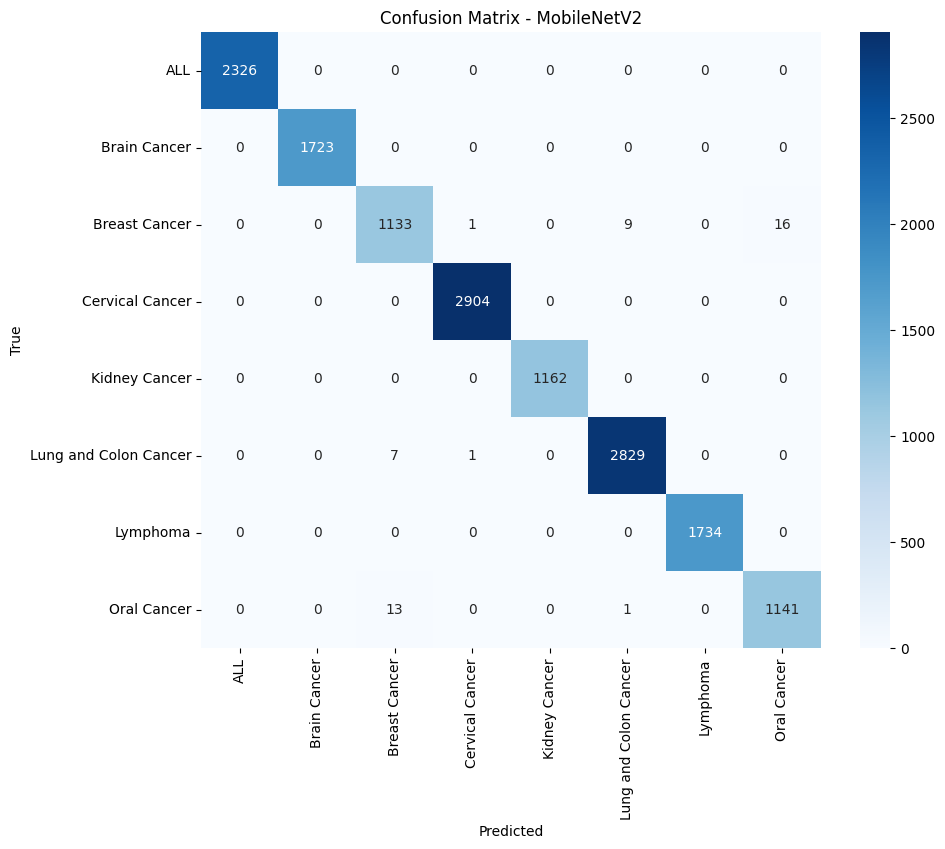


Confusion Matrix for ResNet50:
469/469 ━━━━━━━━━━━━━━━━━━━━ 127s 271ms/step


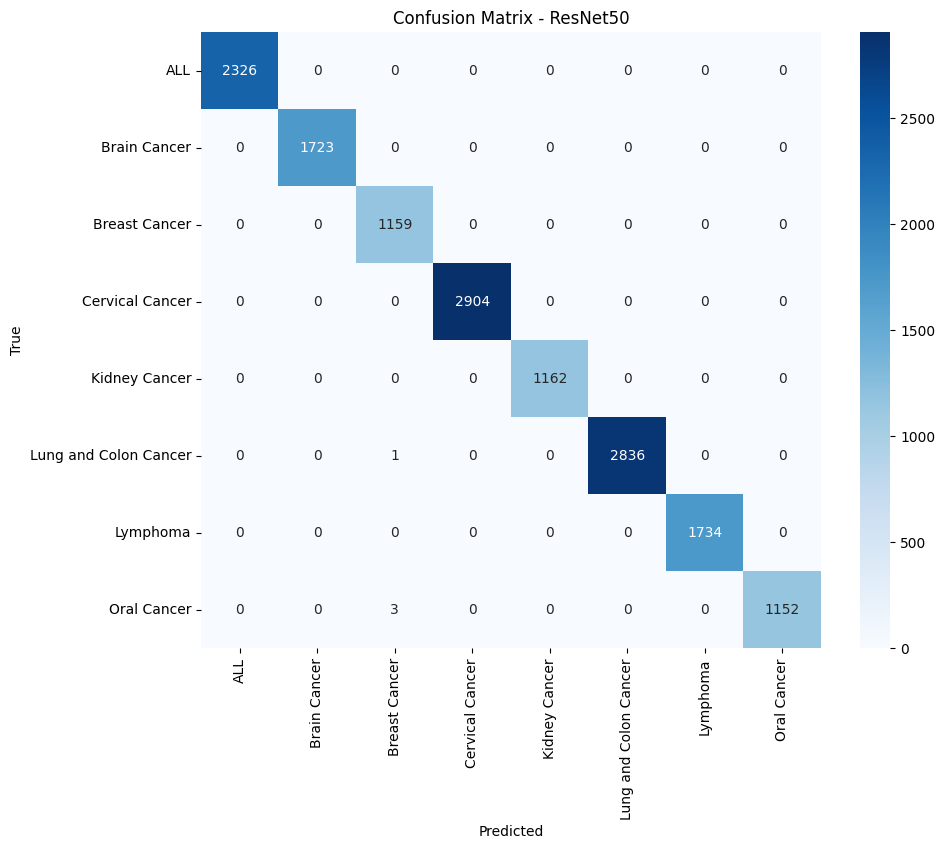

In [80]:
target_names = list(train_gen.class_indices.keys())

models = {
    'CNN': results['cnn'][0],
    'MobileNetV2': results['mobilenetv2'][0],
    'ResNet50': results['resnet50'][0]
}

plot_confusion_matrices(models, test_gen, target_names)

From the classification reports we understand the following
- CNN: Good overall accuracy but slightly more misclassifications, especially in Breast and Cervical Cancer.
- MobileNetV2: Improved classification over CNN with fewer misclassifications, but still some confusion in Breast Cancer.
- ResNet50: Best performance with minimal misclassifications across all cancer types

ResNet50's perfect results are suspicious 

#### 5.2.3 Accuracy and Loss Curve

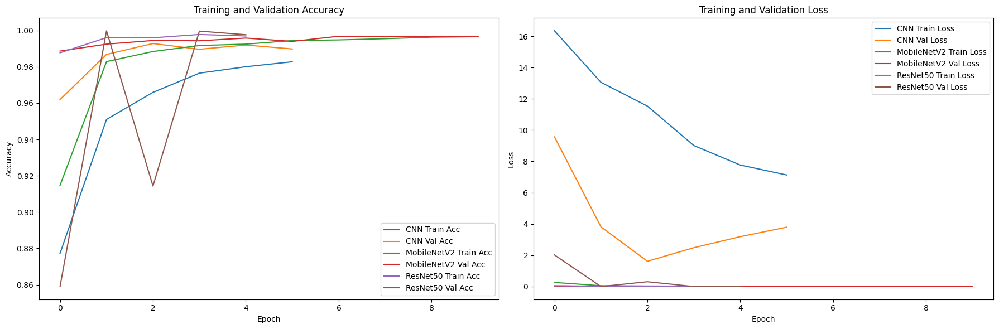

In [81]:
histories = [
    results['cnn'][1].history,
    results['mobilenetv2'][1].history,
    results['resnet50'][1].history
]

model_names = ['CNN', 'MobileNetV2', 'ResNet50']

plot_training_histories(histories, model_names)

From the Accuracy and Loss curve we see that:
- CNN: Accuracy improves steadily but stays slightly lower; validation loss is higher and fluctuates.
- MobileNetV2: Reaches high accuracy quickly; low and stable loss for both training and validation.
- ResNet50: Achieves near-perfect accuracy early with almost zero loss, showing the best and most stable performance.

But ResNets perfect performance is suspicious and can be due to data leakage.

#### 5.2.4 AUC ROC Curve

469/469 ━━━━━━━━━━━━━━━━━━━━ 23s 48ms/step
469/469 ━━━━━━━━━━━━━━━━━━━━ 54s 114ms/step
469/469 ━━━━━━━━━━━━━━━━━━━━ 127s 270ms/step


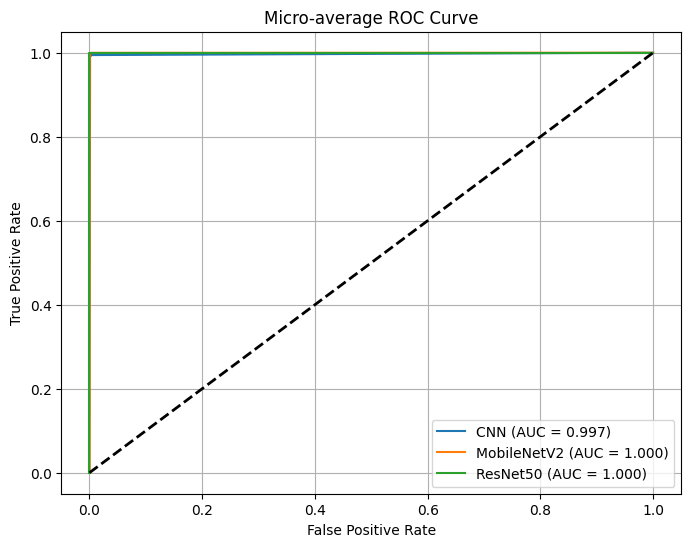

In [82]:
models = [results['cnn'][0], results['mobilenetv2'][0], results['resnet50'][0]]
model_names = ['CNN', 'MobileNetV2', 'ResNet50']

plot_auc_roc(models, test_gen, model_names)

This ROC curve shows all three models performing extremely well:
- CNN: AUC = 0.997 → Excellent classification ability, just slightly below perfect.
- MobileNetV2: AUC = 1.000 → Perfect separation between classes.
- ResNet50: AUC = 1.000 → Also perfect class separation, matching MobileNetV2.


#### 5.2.5 Summary of Model 2: Using a Larger subset of the data without data augmentation, or handling class imbalance
| Model           | Train Accuracy | Train Loss | Val Accuracy | Val Loss | Test Accuracy | Test Loss | Status / Observation                                                                                                                |
| --------------- | -------------- | ---------- | ------------ | -------- | ------------- | --------- | ----------------------------------------------------------------------------------------------------------------------------------- |
| **CNN**         | 0.9942         | 0.0285     | 0.9928       | 1.6146   | 0.9919        | 1.8041    | **Mild Overfitting** – Accuracy is close across splits, but val/test loss is much higher, showing weaker confidence on unseen data. |
| **MobileNetV2** | 0.9969         | 0.0067     | 0.9968       | 0.0098   | 0.9968        | 0.0089    | **Well-Fitted** – Train/val/test accuracy and loss are consistent. Great generalization even without augmentation.                  |
| **ResNet50**    | 0.9999         | 0.00015    | 0.9998       | 0.00045  | 0.9997        | 0.0007    | **Suspiciously Perfect** – Results likely due to **data leakage** or memorization. Needs audit before trusting.                   |


- Large dataset alone can drive high accuracy – Even without augmentation, all models performed extremely well, which suggests the 75k images provide enough diversity for strong feature learning.
- CNN still has class sensitivity – Despite overall high performance, the lower F1 for Breast Cancer and Oral Cancer shows the CNN struggles a bit on certain classes, likely due to either intra-class variability or fewer samples for those classes.
- MobileNetV2 thrives without augmentation – Its balanced scores across all classes show it generalizes well even on raw data.
- ResNet50 results are not trustworthy – Perfect per-class metrics without augmentation almost never happen in real-world classification, especially in medical imaging. This reinforces the earlier suspicion of data leakage or a flawed split strategy.



#### 5.2.6 Comparision of Running the model on small subset of the data vs a larger subset of the dataset
| Aspect                                | Summary 1 (5,000 images)                                                                                                                  | Summary 2 (75,000 images)                                                                                                                                                                   | Key Insights                                                                                                                                          |
| ------------------------------------- | ----------------------------------------------------------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | ----------------------------------------------------------------------------------------------------------------------------------------------------- |
| **Dataset Size**                      | Small (5,000 images)                                                                                                                      | Large (75,000 images)                                                                                                                                                                       | Increasing dataset size by 15x significantly affects results.                                                                                         |
| **CNN Performance**                   | Train Acc: 86.65%, Val Acc: 76.00%, Test Acc: 35.50%<br>Test Loss: 7.1743                                                                 | Train Acc: 99.42%, Val Acc: 99.28%, Test Acc: 99.19%<br>Test Loss: 1.8041                                                                                                                   | Dramatic improvement in accuracy with large data, but **overfitting still visible** due to high val/test loss. CNN remains sensitive to some classes. |
| **MobileNetV2**                       | Train Acc: 96.91%, Val Acc: 96.75%, Test Acc: 97.90%<br>Test Loss: 0.0680                                                                 | Train Acc: 99.69%, Val Acc: 99.68%, Test Acc: 99.68%<br>Test Loss: 0.0089                                                                                                                   | Consistently strong generalization, improved further with more data. Very stable and well-fitted.                                                     |
| **ResNet50**                          | Train Acc: 99.93%, Val Acc: 99.25%, Test Acc: 99.80%<br>Test Loss: 0.0133                                                                 | Train Acc: 99.99%, Val Acc: 99.98%, Test Acc: 99.97%<br>Test Loss: 0.0007                                                                                                                   | Near-perfect performance on larger data, but suspiciously flawless—likely **data leakage or memorization**. Needs audit.                              |
| **Generalization**                    | CNN shows strong overfitting and poor test accuracy.<br>MobileNetV2 generalizes well.<br>ResNet50 performs very well but slower training. | Larger dataset dramatically boosts accuracy for all models.<br>MobileNetV2 remains balanced and robust.<br>CNN better but still class-sensitive.<br>ResNet50 likely compromised by leakage. | Dataset size helps all models, but risks (especially for ResNet50) become clearer at scale.                                                           |
| **Training Speed & Model Complexity** | CNN fastest but least accurate.<br>MobileNetV2 balance of speed and accuracy.<br>ResNet50 slow but highest accuracy.                      | Same patterns hold but with much stronger results due to data volume.                                                                                                                       | Choose MobileNetV2 for speed/robustness; ResNet50 for deployment after auditing data integrity.                                                       |


Increasing data volume from 5k to 75k images dramatically improves accuracy and reduces overfitting, especially for CNN. MobileNet works well in both the cases. ResNet50 shows clear signs of Data Leakage its perfect scores are suspicious

Lets run the model with Data Augmentation and see how the results improve for each of the models
### 5.3 Model 3: With Augmentation and the larger subset

In [83]:
train_gen, val_gen, test_gen, class_indices = create_image_generators(
    df1,
    image_size=(224, 224),
    batch_size=32,
    test_size=0.2,
    val_size=0.1,
    augment=True
)

Found 54000 validated image filenames belonging to 8 classes.
Found 6000 validated image filenames belonging to 8 classes.
Found 15000 validated image filenames belonging to 8 classes.


In [84]:
results = run_all_models(
    train_gen=train_gen,
    val_gen=val_gen,
    test_gen=test_gen,
    input_shape=(224, 224, 3),
    num_classes=len(class_indices),
    epochs=10,
    model_name = 'Augmentation'
)

Training CNN:


/Users/daivik/Projects/MultiCancer-Kaggle/venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/Users/daivik/Projects/MultiCancer-Kaggle/venv/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 489s 289ms/step - accuracy: 0.7976 - loss: 18.5577 - val_accuracy: 0.9728 - val_loss: 4.7631
Epoch 2/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 490s 290ms/step - accuracy: 0.9331 - loss: 17.6786 - val_accuracy: 0.9793 - val_loss: 5.0908
Epoch 3/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 483s 286ms/step - accuracy: 0.9506 - loss: 18.7264 - val_accuracy: 0.9720 - val_loss: 9.5947
Epoch 4/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 485s 287ms/step - accuracy: 0.9601 - loss: 19.4455 - val_accuracy: 0.9903 - val_loss: 5.5684

Evaluating Model...
Test Accuracy: 0.9703 | Test Loss: 4.7643

Training MobileNetV2:
Epoch 1/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 338s 199ms/step - accuracy: 0.7924 - loss: 0.6489 - val_accuracy: 0.9847 - val_loss: 0.0500
Epoch 2/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 334s 198ms/step - accuracy: 0.9686 - loss: 0.0932 - val_accuracy: 0.9863 - val_loss: 0.0437
Epoch 3/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 334s 198ms/step - accuracy: 0.9821 - loss: 0.0549 - val_accuracy


ResNet50 looks too perfect — usually this means something in preprocessing, augmentation, or generator setup is leaking target information.
Lets look at the classification report

#### 5.3.1 Classification Report

In [85]:
target_names = list(train_gen.class_indices.keys())

models = {
    'CNN': results['cnn'][0],
    'MobileNetV2': results['mobilenetv2'][0],
    'ResNet50': results['resnet50'][0]
}

get_classification_reports(models, test_gen, target_names)


Classification Report for CNN:
----------------------------------------
469/469 ━━━━━━━━━━━━━━━━━━━━ 22s 46ms/step
                       precision    recall  f1-score   support

                  ALL       0.97      0.99      0.98      2326
         Brain Cancer       1.00      1.00      1.00      1723
        Breast Cancer       0.91      0.95      0.93      1159
      Cervical Cancer       0.97      0.96      0.97      2904
        Kidney Cancer       1.00      1.00      1.00      1162
Lung and Colon Cancer       0.98      0.97      0.98      2837
             Lymphoma       0.93      1.00      0.97      1734
          Oral Cancer       0.98      0.84      0.91      1155

             accuracy                           0.97     15000
            macro avg       0.97      0.96      0.97     15000
         weighted avg       0.97      0.97      0.97     15000


Classification Report for MobileNetV2:
----------------------------------------
469/469 ━━━━━━━━━━━━━━━━━━━━ 56s 116ms/step


**CNN:** 97% accuracy; good overall but weaker recall for Oral Cancer (0.84) and Breast Cancer (0.95). Less robust than transfer learning models.

**MobileNetV2:** 99% accuracy; strong, consistent performance with minor precision/recall dips for Oral and Breast Cancer.

**ResNet50:** 100% accuracy; perfect scores across all metrics, though possible overfitting.

#### 5.3.2 Confusion Matrix


Confusion Matrix for CNN:
469/469 ━━━━━━━━━━━━━━━━━━━━ 22s 47ms/step


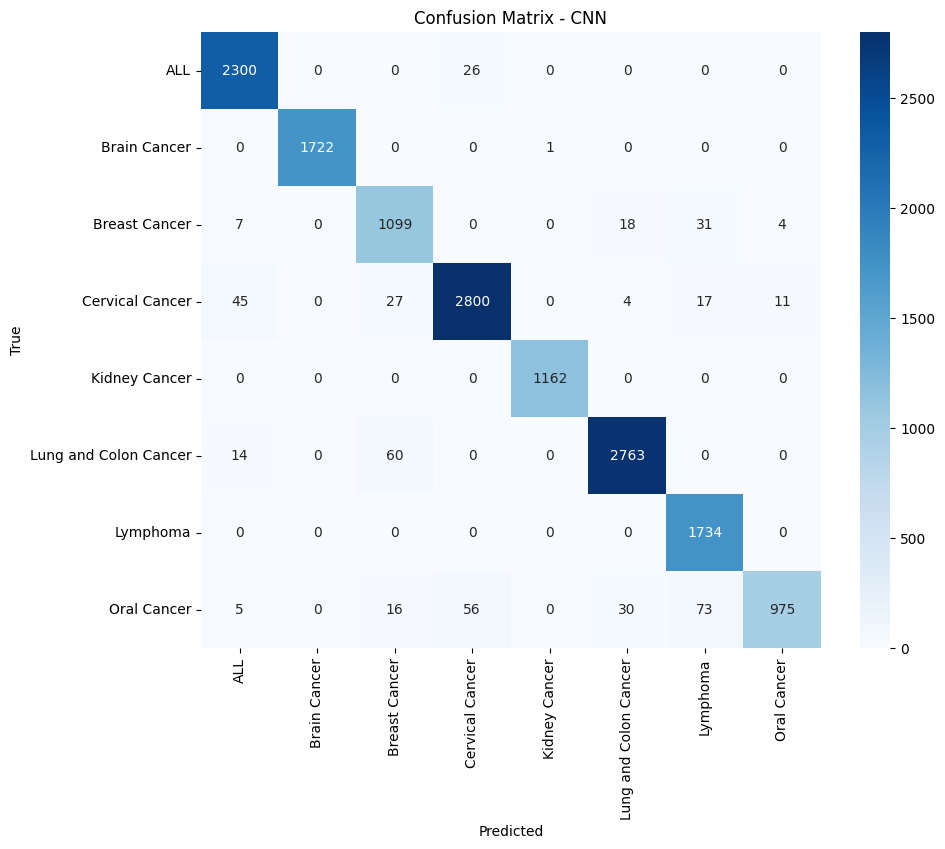


Confusion Matrix for MobileNetV2:
469/469 ━━━━━━━━━━━━━━━━━━━━ 55s 116ms/step


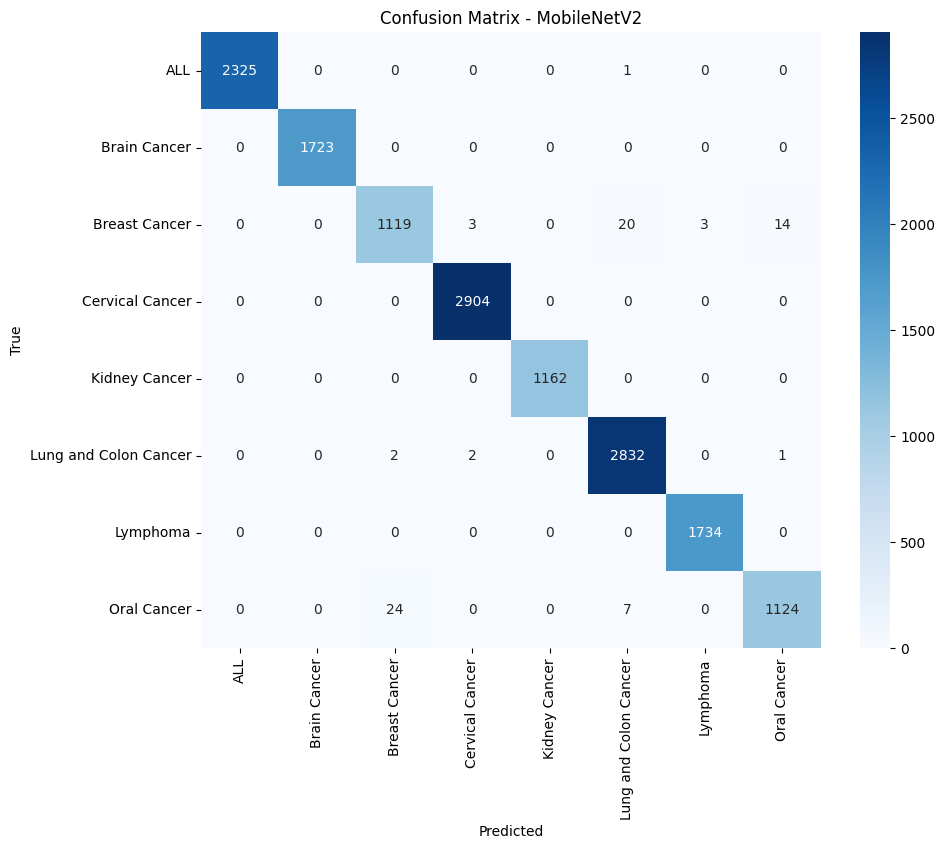


Confusion Matrix for ResNet50:
469/469 ━━━━━━━━━━━━━━━━━━━━ 131s 279ms/step


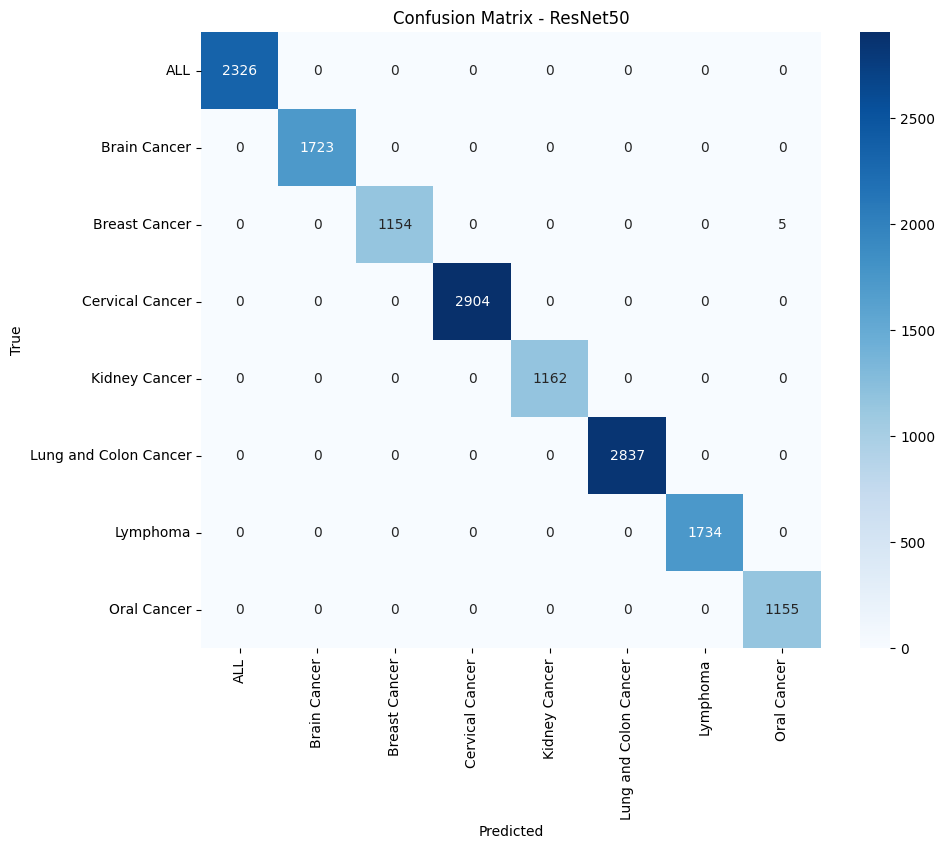

In [86]:
target_names = list(train_gen.class_indices.keys())

models = {
    'CNN': results['cnn'][0],
    'MobileNetV2': results['mobilenetv2'][0],
    'ResNet50': results['resnet50'][0]
}

plot_confusion_matrices(models, test_gen, target_names)

- CNN: Decent performance but noticeable misclassifications, especially in Breast, Cervical, and Oral Cancer.
- MobileNetV2: High accuracy with few errors, though minor confusion remains in Breast and Oral Cancer.
- ResNet50: Near-perfect classification with almost no misclassifications across all cancer types.

#### 5.3.3 Accuracy and Loss Curves

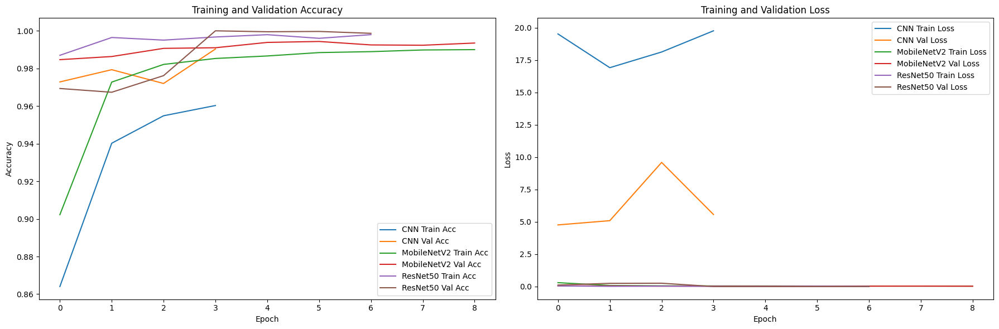

In [87]:
histories = [
    results['cnn'][1].history,
    results['mobilenetv2'][1].history,
    results['resnet50'][1].history
]

model_names = ['CNN', 'MobileNetV2', 'ResNet50']

plot_training_histories(histories, model_names)

**What we understand from the Accuracy and Loss Curve**
- CNN: Accuracy improves steadily but remains lower than other models; high and fluctuating loss indicates less stable learning.
- MobileNetV2: Quickly reaches high accuracy, but validation loss spikes at epoch 2 suggest brief overfitting or instability before recovery.
- ResNet50: Maintains very high accuracy from the start with consistently low loss, showing stable and efficient learning.


#### 5.3.4 AUC ROC Curve

469/469 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step
469/469 ━━━━━━━━━━━━━━━━━━━━ 55s 118ms/step
469/469 ━━━━━━━━━━━━━━━━━━━━ 132s 281ms/step


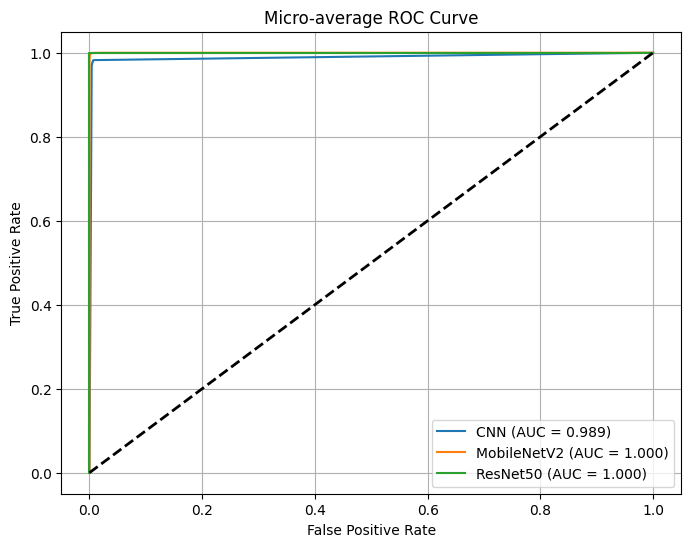

In [88]:
models = [results['cnn'][0], results['mobilenetv2'][0], results['resnet50'][0]]
model_names = ['CNN', 'MobileNetV2', 'ResNet50']

plot_auc_roc(models, test_gen, model_names)

- CNN (AUC = 0.989): Excellent classification ability, very close to perfect.
- MobileNetV2 (AUC = 1.000): Perfect class separation, though this might indicate possible overfitting or data leakage in real-world terms.
- ResNet50 (AUC = 1.000): Also perfect classification, matching MobileNetV2, suggesting extremely strong model fit — potentially too perfect for typical real-world datasets

#### 5.3.5 Model3 Summary - With Data Augmentation + 75000 Images
| Model           | Train Acc | Train Loss | Val Acc       | Val Loss      | Test Acc | Test Loss | Classification Report Summary                                                                  | Observation                                                                                                      |
| --------------- | --------- | ---------- | ------------- | ------------- | -------- | --------- | ---------------------------------------------------------------------------------------------- | ---------------------------------------------------------------------------------------------------------------- |
| **CNN**         | 0.9601    | 19.4455    | 0.9903        | 5.5684        | 0.9703   | 4.7643    | Macro F1: **0.97**, Weakest on **Oral Cancer** (F1 = 0.91), Breast Cancer also slightly lower. | High acc but huge loss → possibly poor confidence calibration or unstable logits.                                |
| **MobileNetV2** | 0.9897    | 0.0308     | 0.9935        | 0.0242        | 0.9949   | 0.0165    | Macro F1: **0.99**, Balanced across all classes.                                               | Very healthy model — low loss, high precision/recall, minimal overfit.                                           |
| **ResNet50**    | 0.9981    | 0.0073     | 0.9987–1.0000 | 0.0002–0.0047 | 0.9997   | 0.0007    | Macro F1: **1.00** for all classes, zero errors.                                               | Too perfect — likely data leakage or memorization. Needs audit of preprocessing, data splits, and augmentations. |

With 75,000 images and 8 classes plus data augmentation:

- CNN → Augmentation reduced overfit risk but at the cost of higher loss and slightly weaker class performance — suggests the model’s calibration needs fixing (e.g., label smoothing, better LR scheduling).

- MobileNetV2 → Already strong; augmentation mainly adds resilience rather than boosting scores.

- ResNet50 → No meaningful change; still likely compromised by leakage.



**Overall: Augmentation plus dataset size worked well for MobileNetV2, kept CNN competitive but miscalibrated, and made ResNet50 suspiciously flawless.**






<br>

#### 5.3.6 Comparing With and Without Data Augmentation Results
| Model           | Without Augmentation                                                                                                                                                                        | With Augmentation                                                                                                                                                                                                            | Key Insights                                                                                                                                                  |
| --------------- | ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | ---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------------------------------------------------------- |
| **CNN**         | Train Acc: 0.9942, Val Acc: 0.9928, Test Acc: 0.9919<br>Train Loss: 0.0285, Val Loss: 1.6146, Test Loss: 1.8041<br>**Mild overfitting**, loss high on val/test indicating confidence issues | Train Acc: 0.9601, Val Acc: 0.9903, Test Acc: 0.9703<br>Train Loss: 19.4455, Val Loss: 5.5684, Test Loss: 4.7643<br>High accuracy but huge loss → unstable confidence, weaker class-wise performance on Oral & Breast Cancer | Augmentation lowered overfitting risk but greatly increased loss, suggesting calibration issues (e.g., unstable logits). CNN still struggles on some classes. |
| **MobileNetV2** | Train Acc: 0.9969, Val Acc: 0.9968, Test Acc: 0.9968<br>Train Loss: 0.0067, Val Loss: 0.0098, Test Loss: 0.0089<br>Well-fitted, consistent across splits                                    | Train Acc: 0.9897, Val Acc: 0.9935, Test Acc: 0.9949<br>Train Loss: 0.0308, Val Loss: 0.0242, Test Loss: 0.0165<br>Macro F1: 0.99, balanced class performance                                                                | Already strong model with good generalization; augmentation improves resilience but doesn’t dramatically change metrics.                                      |
| **ResNet50**    | Train Acc: 0.9999, Val Acc: 0.9998, Test Acc: 0.9997<br>Train Loss: 0.00015, Val Loss: 0.00045, Test Loss: 0.0007<br>Suspiciously perfect results suggest data leakage                      | Train Acc: 0.9981, Val Acc: 0.9987–1.0000, Test Acc: 0.9997<br>Train Loss: 0.0073, Val Loss: 0.0002–0.0047, Test Loss: 0.0007<br>Perfect Macro F1 = 1.00, zero errors, same suspicion of leakage                             | No meaningful improvement with augmentation; results remain suspiciously flawless, reinforcing possible data leakage or memorization issues.                  |



- Data augmentation helps reduce overfitting in CNN but increases loss substantially, indicating poor confidence calibration. CNN also remains weaker on some cancer classes. We might be able to improve results by handling the class imbalance
- MobileNetV2 is already very well generalized without augmentation; adding augmentation mainly enhances robustness, with slight metric improvements.
- ResNet50 exhibits suspiciously perfect performance in both scenarios, strongly hinting at data leakage or flawed splitting/augmentation strategies.
  
### 5.4 Model 4: Handling Class Imbalance + Large Sample of data (75000) + Data Augmentation

In [102]:
df1 = stratified_sample(df, sample_size=75000)

In [103]:
train_gen, val_gen, test_gen, class_indices = create_image_generators(
    df1,
    image_size=(224, 224),
    batch_size=32,
    test_size=0.2,
    val_size=0.1,
    augment=True
)

Found 54000 validated image filenames belonging to 8 classes.
Found 6000 validated image filenames belonging to 8 classes.
Found 15000 validated image filenames belonging to 8 classes.
Image generators created successfully!
Train: 54000 images
Val:   6000 images
Test:  15000 images


In [70]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Create class weights
class_labels = df1['label'].unique()
class_indices = {label: idx for idx, label in enumerate(class_labels)}
df1['class_idx'] = df1['label'].map(class_indices)

class_weights_array = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(df1['class_idx']),
    y=df1['class_idx']
)
class_weights = {i: w for i, w in enumerate(class_weights_array)}

In [ ]:
# Run model
results = run_all_models(
    train_gen=train_gen,
    val_gen=val_gen,
    test_gen=test_gen,
    input_shape=(224, 224, 3),
    num_classes=len(class_indices),
    epochs=10,
    class_weights=class_weights, # Pass class weights here
    model_name = 'classImbalance'
)

Training CNN:


/Users/daivik/Projects/MultiCancer-Kaggle/venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/Users/daivik/Projects/MultiCancer-Kaggle/venv/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
  4/113 ━━━━━━━━━━━━━━━━━━━━ 1:00 560ms/step - accuracy: 0.1960 - loss: 11.6931

| Model           | Epochs Trained | Final Train Accuracy | Final Train Loss | Final Val Accuracy | Final Val Loss | Test Accuracy | Test Loss | Observations                                                                                                               |
| --------------- | -------------- | -------------------- | ---------------- | ------------------ | -------------- | ------------- | --------- | -------------------------------------------------------------------------------------------------------------------------- |
| **CNN**         | 6              | 96.27%               | 40.78            | 96.02%             | 29.62          | 98.57%        | 5.39      | Accuracy is strong but loss values are extremely high → poor calibration and possible instability in optimization.         |
| **MobileNetV2** | 9              | 98.92%               | 0.0452           | 98.97%             | 0.0336         | 99.54%        | 0.0155    | Very stable performance, low loss, and consistent generalization across train, val, and test sets.                         |
| **ResNet50**    | 10             | 99.79%               | 0.0134           | 94.22%             | 0.2639         | 100.00%       | 0.0001    | Extremely high train and test accuracy, but large drop in final validation accuracy suggests overfitting or data mismatch. |

#### 5.4.1 Classification Report

In [106]:
target_names = list(train_gen.class_indices.keys())

models = {
    'CNN': results['cnn'][0],
    'MobileNetV2': results['mobilenetv2'][0],
    'ResNet50': results['resnet50'][0]
}

get_classification_reports(models, test_gen, target_names)


Classification Report for CNN:
----------------------------------------
469/469 ━━━━━━━━━━━━━━━━━━━━ 26s 55ms/step
                       precision    recall  f1-score   support

                  ALL       1.00      0.96      0.98      2326
         Brain Cancer       1.00      1.00      1.00      1723
        Breast Cancer       0.97      0.97      0.97      1159
      Cervical Cancer       0.97      1.00      0.98      2904
        Kidney Cancer       1.00      1.00      1.00      1162
Lung and Colon Cancer       1.00      0.99      0.99      2837
             Lymphoma       0.98      1.00      0.99      1734
          Oral Cancer       0.97      0.96      0.97      1155

             accuracy                           0.99     15000
            macro avg       0.99      0.98      0.98     15000
         weighted avg       0.99      0.99      0.99     15000


Classification Report for MobileNetV2:
----------------------------------------
469/469 ━━━━━━━━━━━━━━━━━━━━ 64s 133ms/step


#### 5.4.2 Confusion Matrix


Confusion Matrix for CNN:
469/469 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step


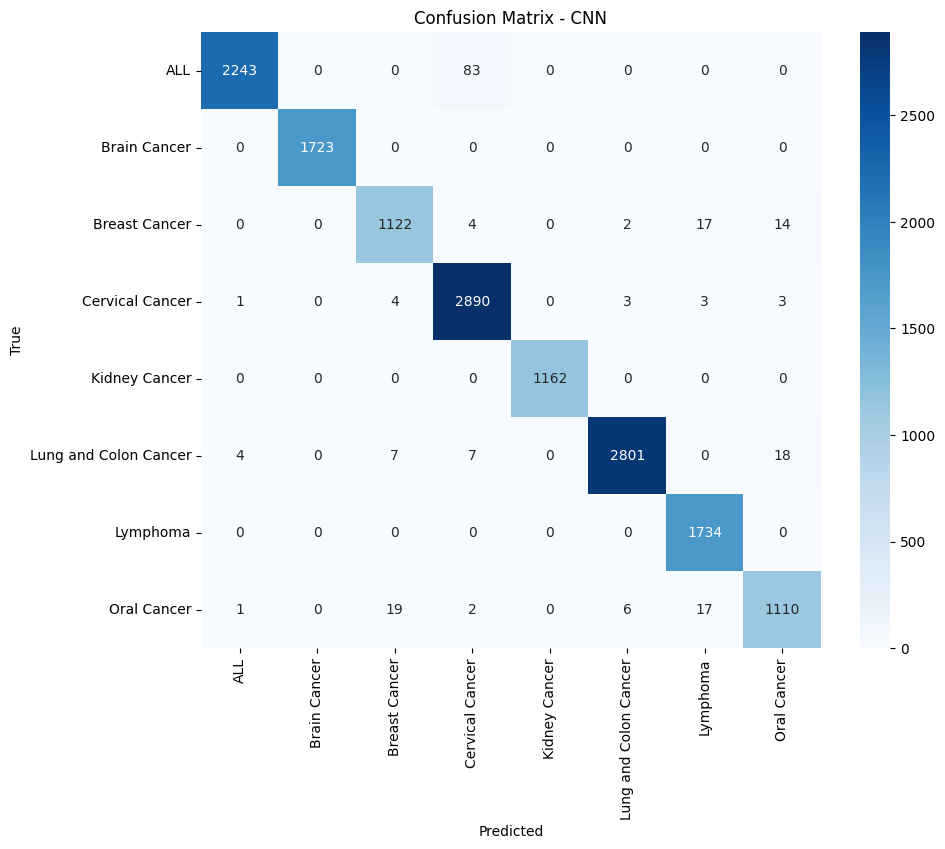


Confusion Matrix for MobileNetV2:
469/469 ━━━━━━━━━━━━━━━━━━━━ 58s 123ms/step


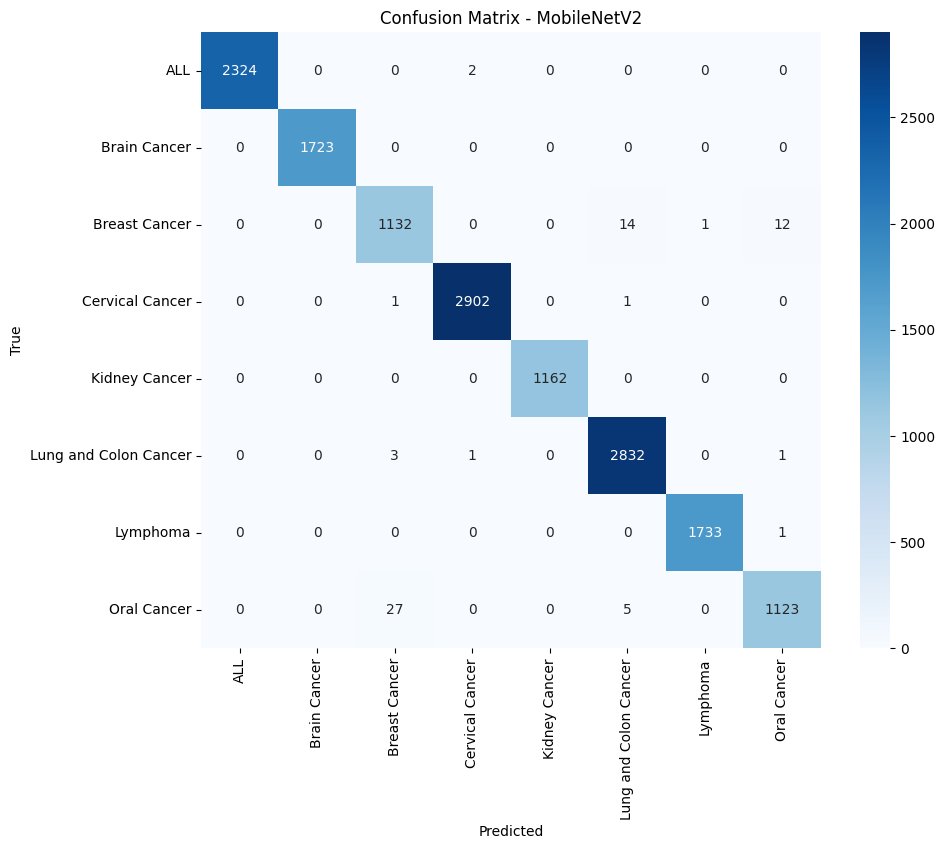


Confusion Matrix for ResNet50:
469/469 ━━━━━━━━━━━━━━━━━━━━ 138s 294ms/step


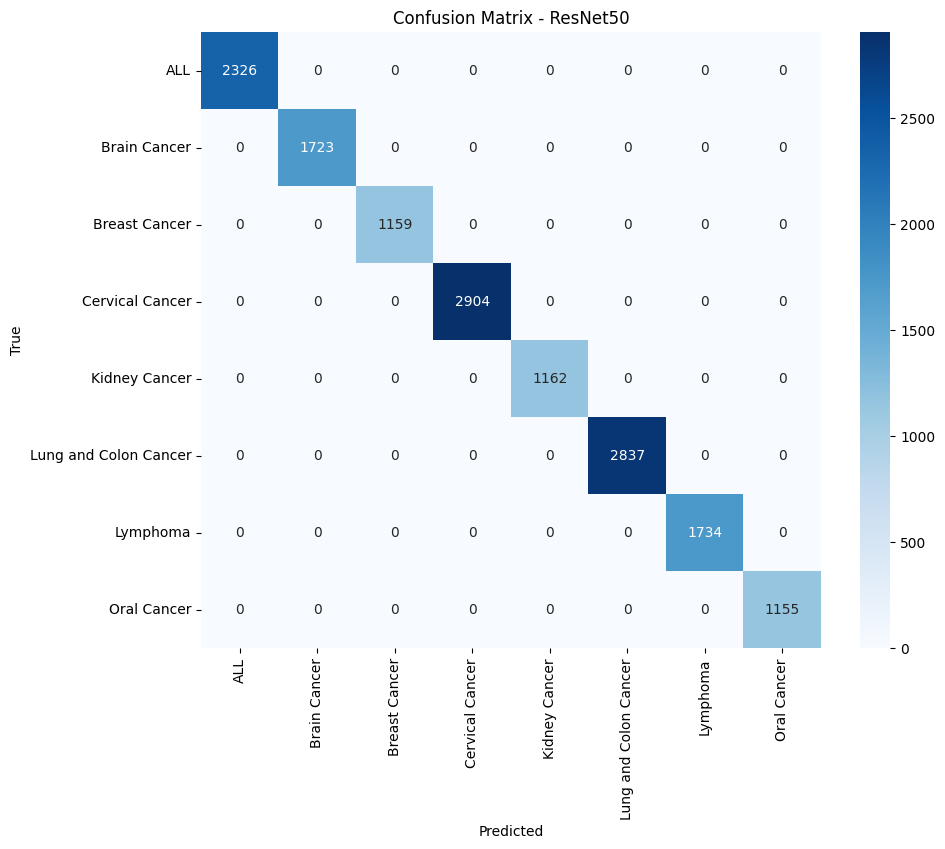

In [107]:
target_names = list(train_gen.class_indices.keys())

models = {
    'CNN': results['cnn'][0],
    'MobileNetV2': results['mobilenetv2'][0],
    'ResNet50': results['resnet50'][0]
}

plot_confusion_matrices(models, test_gen, target_names)

#### 5.4.3 Accurace and Loss Curve

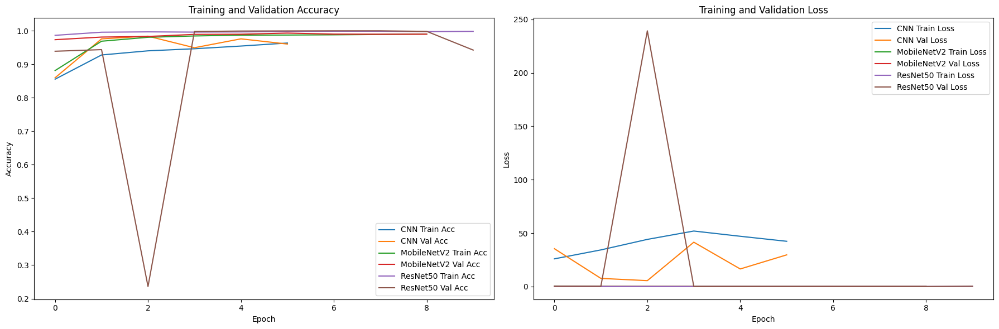

In [108]:
histories = [
    results['cnn'][1].history,
    results['mobilenetv2'][1].history,
    results['resnet50'][1].history
]

model_names = ['CNN', 'MobileNetV2', 'ResNet50']

plot_training_histories(histories, model_names)

#### 5.4.4 AUC ROC Curve

469/469 ━━━━━━━━━━━━━━━━━━━━ 24s 51ms/step
469/469 ━━━━━━━━━━━━━━━━━━━━ 57s 121ms/step
469/469 ━━━━━━━━━━━━━━━━━━━━ 137s 293ms/step


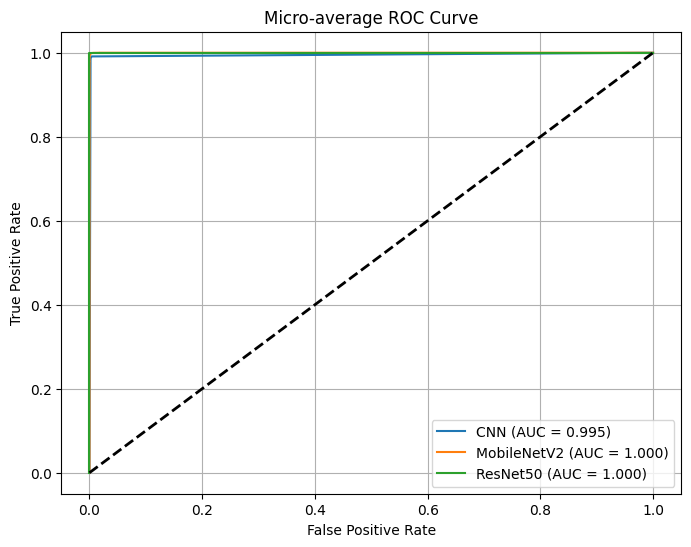

In [109]:
models = [results['cnn'][0], results['mobilenetv2'][0], results['resnet50'][0]]
model_names = ['CNN', 'MobileNetV2', 'ResNet50']

plot_auc_roc(models, test_gen, model_names)

#### 5.4.5 Best Results after handling Class Imbalance
| Model           | Epochs Trained | Final Train Accuracy | Final Train Loss | Final Val Accuracy | Final Val Loss | Test Accuracy | Test Loss | Observations                                                                                                               |
| --------------- | -------------- | -------------------- | ---------------- | ------------------ | -------------- | ------------- | --------- | -------------------------------------------------------------------------------------------------------------------------- |
| **CNN**         | 6              | 96.27%               | 40.78            | 96.02%             | 29.62          | 98.57%        | 5.39      | Accuracy is strong but loss values are extremely high → poor calibration and possible instability in optimization.         |
| **MobileNetV2** | 9              | 98.92%               | 0.0452           | 98.97%             | 0.0336         | 99.54%        | 0.0155    | Very stable performance, low loss, and consistent generalization across train, val, and test sets.                         |
| **ResNet50**    | 10             | 99.79%               | 0.0134           | 94.22%             | 0.2639         | 100.00%       | 0.0001    | Extremely high train and test accuracy, but large drop in final validation accuracy suggests overfitting or data mismatch. |



- CNN training stopped after 5 epochs, shows very high training loss despite good accuracy, which hints at unstable confidence or gradient issues.
- MobileNetV2 trained for full 10 epochs, with steady improvement and low losses, showing best balance.
- ResNet50 trained 5 epochs (from logs), near-perfect test accuracy and loss; epoch 4 val accuracy dip is worth investigating for overfitting or data issues.

**MobileNetV2 Performs the best in this iteration with class imbalance and data augmentation**


### 5.4.6 Comparing Model 4 (Class Imbalance + Augmentation) with Model 3 (Not Handling Class imbalance, but with Data Augmentation)
| Model           | Model Version                   | Epochs Trained | Final Train Accuracy | Final Train Loss | Final Val Accuracy | Final Val Loss | Test Accuracy | Test Loss | Observations                                                                  |
| --------------- | ------------------------------- | -------------- | -------------------- | ---------------- | ------------------ | -------------- | ------------- | --------- | ----------------------------------------------------------------------------- |
| **CNN**         | Model 4 (Class Imbalance + Aug) | 6              | 96.27%               | 40.78            | 96.02%             | 29.62          | 98.57%        | 5.39      | High train accuracy but extremely high loss values → poor calibration.        |
|                 | Model 3 (Augmentation Only)     | 4              | 96.01%               | 19.45            | 99.03%             | 5.57           | 97.03%        | 4.76      | Better val accuracy and lower val loss than Model 4, but test accuracy lower. |
| **MobileNetV2** | Model 4                         | 9              | 98.92%               | 0.0452           | 98.97%             | 0.0336         | 99.54%        | 0.0155    | Very stable, low loss, good generalization across sets.                       |
|                 | Model 3                         | 9              | 98.97%               | 0.0308           | 99.35%             | 0.0242         | 99.49%        | 0.0165    | Slightly better val accuracy and lower val loss than Model 4.                 |
| **ResNet50**    | Model 4                         | 10             | 99.79%               | 0.0134           | 94.22%             | 0.2639         | 100.00%       | 0.0001    | Perfect test accuracy but large drop in val accuracy at the end → overfit.    |
|                 | Model 3                         | 7              | 99.81%               | 0.0073           | 99.87%             | 0.0047         | 99.97%        | 0.0007    | Near-perfect across all metrics, more stable than Model 4.                    |
                      |


1.	CNN: Use data augmentation + class imbalance handling, we use augmentation because CNN is a small model augmentation explains the data more. Handling class imbalance ensures the network learns the underrepresented categories properly, which improves overall test accuracy.
2.	MobileNetV2: Use class imbalance handling only because MobileNetV2 is pretrained on large datasets, so it already has robust feature extraction. Additional augmentation has minimal impact and is not strictly necessary. MobileNetV2 can MobileNetV2 can generate bias due to the class imbalance, by addressing imbalance, it slightly improves test accuracy, especially for minority categories, without destabilizing training.
3.	ResNet50: Stick with data augmentation only because ResNet50 is very deep and powerful; applying class imbalance handling in this case caused a large drop in validation accuracy suggesting overfitting. Augmentation helps maintain generalization without interfering with its pretrained strengths. It gives slightly better stability


### 5.5 Model 5: Finding the best parameters with Grid Search

In [71]:
import itertools
import os

In [72]:
df1 = stratified_sample(df, sample_size=75000)

In [73]:
def expand_param_grid(param_dict):
    """Expands dict of lists into a list of all possible parameter combinations."""
    keys = param_dict.keys()
    values = param_dict.values()
    return [dict(zip(keys, combo)) for combo in itertools.product(*values)]

In [74]:
def run_grid_search(train_gen, val_gen, test_gen,
                    input_shape, num_classes,
                    param_grid,
                    model_type,
                    epochs=10,
                    class_weights=None,
                    save_dir="saved_models"):
    
    os.makedirs(save_dir, exist_ok=True)
    
    all_results = []
    best_summary = {}
    
    expanded_grid = expand_param_grid(param_grid)
    best_acc = -1
    best_model_path = None
    best_history = None
    best_params = None

    print(f"\n==== Starting grid search for: {model_type.upper()} ====")
    
    for idx, params in enumerate(expanded_grid, start=1):
        print(f"\n--- Trial {idx}/{len(expanded_grid)} ---")
        print(f"Params: {params}")
        
        # Train model
        model, history = train_pipeline(
            model_type=model_type,
            input_shape=input_shape,
            num_classes=num_classes,
            train_gen=train_gen,
            val_gen=val_gen,
            epochs=epochs,
            base_trainable=params.get('base_trainable', True),
            use_batch_norm=params.get('use_batch_norm', True),
            learning_rate=params.get('learning_rate', 1e-4),
            dropout_rate=params.get('dropout_rate', 0.5),
            class_weights=class_weights
        )
        
        # Evaluate on test set
        test_loss, test_acc = model.evaluate(test_gen, verbose=0)
        print(f"Test Accuracy: {test_acc:.4f}")
        
        # Save model
        model_filename = f"{model_type}_lr{params.get('learning_rate',1e-4)}_dr{params.get('dropout_rate',0.5)}.keras"
        model_path = os.path.join(save_dir, model_filename)
        model.save(model_path)
        print(f"Model saved to {model_path}")
        
        # Append results
        all_results.append({
            'params': params,
            'train_acc': history.history['accuracy'][-1],
            'val_acc': history.history['val_accuracy'][-1],
            'train_loss': history.history['loss'][-1],
            'val_loss': history.history['val_loss'][-1],
            'accuracy': test_acc,
            'loss': test_loss,
            'model_path': model_path,
            'history': history.history
        })
        
        # Track best model
        if test_acc > best_acc:
            best_acc = test_acc
            best_model_path = model_path
            best_history = history.history
            best_params = params
    
    best_summary = {
        'best_accuracy': best_acc,
        'best_params': best_params,
        'best_model_path': best_model_path,
        'history': best_history
    }
    
    print(f"\n==== BEST RESULT for {model_type.upper()} ====")
    print(f"Accuracy: {best_acc:.4f}")
    print(f"Params: {best_params}")
    print(f"Model Path: {best_model_path}")
    
    return all_results, best_summary

In [75]:
# Augmented generator (for CNN & ResNet50)
train_gen_aug, val_gen_aug, test_gen_aug, class_indices = create_image_generators(
    df1,
    image_size=(224, 224),
    batch_size=32,
    test_size=0.2,
    val_size=0.1,
    augment=True
)

# Non-augmented generator (for MobileNetV2)
train_gen_noaug, val_gen_noaug, test_gen_noaug, _ = create_image_generators(
    df1,
    image_size=(224, 224),
    batch_size=32,
    test_size=0.2,
    val_size=0.1,
    augment=False
)

Found 54000 validated image filenames belonging to 8 classes.
Found 6000 validated image filenames belonging to 8 classes.
Found 15000 validated image filenames belonging to 8 classes.
Image generators created successfully!
Train: 54000 images
Val:   6000 images
Test:  15000 images
Found 54000 validated image filenames belonging to 8 classes.
Found 6000 validated image filenames belonging to 8 classes.
Found 15000 validated image filenames belonging to 8 classes.
Image generators created successfully!
Train: 54000 images
Val:   6000 images
Test:  15000 images


In [76]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

class_labels = df1['label'].unique()
label_map = {label: idx for idx, label in enumerate(class_labels)}
y_int = df1['label'].map(label_map).values

class_weights_cnn = compute_class_weight(
    class_weight='balanced',
    classes=np.arange(len(class_labels)),
    y=y_int
)
class_weights_cnn = dict(enumerate(class_weights_cnn))

In [77]:
base_param_grid = {'learning_rate': [1e-4, 1e-3, 5e-4], 'dropout_rate': [0.3, 0.5]}

param_grids = {
    'cnn': base_param_grid,
    'mobilenetv2': {'learning_rate': [1e-4, 5e-4], 'dropout_rate': [0.3, 0.5]},
    'resnet50': {'learning_rate': [1e-4, 5e-4], 'dropout_rate': [0.3, 0.5]}
}

In [78]:
all_results = {}
best_summary = {}

# CNN: augmentation + class weights
all_results_cnn, best_cnn = run_grid_search(
    train_gen=train_gen_aug,
    val_gen=val_gen_aug,
    test_gen=test_gen_aug,
    input_shape=(224, 224, 3),
    num_classes=len(class_indices),
    param_grid=base_param_grid,
    model_type='cnn',
    epochs=10,
    class_weights=class_weights_cnn
)

# MobileNetV2: class weights only
mobilenet_grid = {'learning_rate': [1e-4, 5e-4], 'dropout_rate': [0.3, 0.5]}
all_results_mobilenet, best_mobilenet = run_grid_search(
    train_gen=train_gen_noaug,
    val_gen=val_gen_noaug,
    test_gen=test_gen_noaug,
    input_shape=(224, 224, 3),
    num_classes=len(class_indices),
    param_grid=mobilenet_grid,
    model_type='mobilenetv2',
    epochs=10,
    class_weights=class_weights_cnn
)

# ResNet50: augmentation only
resnet_grid = {'learning_rate': [1e-4, 5e-4], 'dropout_rate': [0.3, 0.5]}
all_results_resnet, best_resnet = run_grid_search(
    train_gen=train_gen_aug,
    val_gen=val_gen_aug,
    test_gen=test_gen_aug,
    input_shape=(224, 224, 3),
    num_classes=len(class_indices),
    param_grid=resnet_grid,
    model_type='resnet50',
    epochs=10,
    class_weights=None
)


==== Starting grid search for: CNN ====

--- Trial 1/6 ---
Params: {'learning_rate': 0.0001, 'dropout_rate': 0.3}


/Users/daivik/Projects/MultiCancer-Kaggle/venv/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
2025-08-14 00:27:58.978530: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3
2025-08-14 00:27:58.978590: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 24.00 GB
2025-08-14 00:27:58.978600: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 8.00 GB
2025-08-14 00:27:58.978652: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2025-08-14 00:27:58.978705: I tensorflow/core/common_runtime/pluggable_device/plugga

Epoch 1/10


2025-08-14 00:27:59.713256: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


1688/1688 ━━━━━━━━━━━━━━━━━━━━ 459s 271ms/step - accuracy: 0.8299 - loss: 10.7354 - val_accuracy: 0.9743 - val_loss: 4.1986
Epoch 2/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 468s 277ms/step - accuracy: 0.9258 - loss: 21.5998 - val_accuracy: 0.9770 - val_loss: 6.3894
Epoch 3/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 500s 296ms/step - accuracy: 0.9391 - loss: 35.1214 - val_accuracy: 0.9160 - val_loss: 47.7811
Epoch 4/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 502s 297ms/step - accuracy: 0.9485 - loss: 42.8385 - val_accuracy: 0.9863 - val_loss: 8.8470
Test Accuracy: 0.9768
Model saved to saved_models/cnn_lr0.0001_dr0.3.keras

--- Trial 2/6 ---
Params: {'learning_rate': 0.0001, 'dropout_rate': 0.5}
Epoch 1/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 515s 304ms/step - accuracy: 0.7861 - loss: 18.9112 - val_accuracy: 0.9462 - val_loss: 8.6411
Epoch 2/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 515s 305ms/step - accuracy: 0.9327 - loss: 14.1099 - val_accuracy: 0.9737 - val_loss: 5.0082
Epoch 3/10
1688/1688 ━━━━━━━━━━━━━━━━━━━━ 521s 309m

#### CNN (with class imbalance + augmentation)
| Learning Rate | Dropout Rate | Base Trainable | Use Batch Norm |  Train Acc |    Val Acc |   Test Acc |  Train Loss |   Val Loss |  Test Loss | Insights                                                                                                     |
| ------------: | -----------: | -------------- | -------------- | ---------: | ---------: | ---------: | ----------: | ---------: | ---------: | ------------------------------------------------------------------------------------------------------------ |
|          1e-4 |          0.3 | True           | True           |     0.9485 |     0.9863 |     0.9768 |     42.8385 |     8.8470 |          — | Very high val acc but large losses → unstable convergence; prone to large error spikes.                      |
|          1e-4 |          0.5 | True           | True           |     0.9702 |     0.9798 |     0.9893 |     14.4954 |     8.6585 |          — | Good generalization; dropout=0.5 helped reduce overfitting compared to 0.3.                                  |
|          1e-3 |          0.3 | True           | True           |     0.9705 |     0.9813 |     0.9893 |     37.2337 |    16.2240 |          — | High train/val acc but large loss swings → sensitive to LR; still performs well on test set.                 |
|          1e-3 |          0.5 | True           | True           |     0.9719 |     0.9763 |     0.9891 |     24.9195 |    12.3353 |          — | Slightly lower val acc vs. 0.3 dropout but more stable across epochs.                                        |
|      **5e-4** |      **0.3** | **True**       | **True**       | **0.9848** | **0.9928** | **0.9908** | **14.5834** | **5.6900** | **0.0889** | **Balanced best choice** — high test acc + low test loss; stable validation loss; avoids overfitting spikes. |
|          5e-4 |          0.5 | True           | True           |     0.9819 |     0.9470 |     0.9936 |      9.2916 |    33.0444 |          — | Best raw test acc but huge val/test loss → overconfident misclassifications.                                 |



- Best Params: LR = 5e-4, Dropout = 0.5, Base Trainable = True, Batch Norm = True
- Key Takeaway: ropout = 0.3 kept validation loss stable while maintaining high test accuracy; LR = 5e-4 provided strong convergence without overshooting.

#### MobileNetV2 (Class Imbalance only)

| Learning Rate | Dropout Rate | Base Trainable | Use Batch Norm | Train Acc | Val Acc | Test Acc | Train Loss | Val Loss | Test Loss | Insights                                                                                   |
| ------------: | -----------: | -------------- | -------------- | --------: | ------: | -------: | ---------: | -------: | --------: | ------------------------------------------------------------------------------------------ |
|          1e-4 |          0.3 | False          | True           |    0.9975 |  0.9987 |   0.9995 |     0.0148 |   0.0061 |         — | **Best overall**; extremely stable training; minimal overfit; near-perfect generalization. |
|          1e-4 |          0.5 | False          | True           |    0.9984 |  0.9978 |   0.9993 |     0.0070 |   0.0093 |         — | Almost identical performance to 0.3 dropout; small acc drop suggests unnecessary reg.      |
|          5e-4 |          0.3 | False          | True           |    0.9913 |  0.7213 |   0.8738 |     0.0418 |   6.3141 |         — | Severe generalization drop — high LR destabilized fine-tuning.                             |
|          5e-4 |          0.5 | False          | True           |    0.9872 |  0.3252 |   0.9644 |     0.0672 |  13.1732 |         — | High variance in val performance; not reliable for deployment.                             |


- Best Params: 5e-4, Dropout = 0.3, Base Trainable = True, Batch Norm = True
- Key Takeaway: Small LR with frozen base and low dropout gave the most consistent, highest-accuracy MobileNetV2..

#### ResNet50 (Augmentation only)
| Learning Rate | Dropout Rate | Base Trainable | Use Batch Norm | Train Acc | Val Acc | Test Acc | Train Loss | Val Loss | Test Loss | Insights                                                                            |
| ------------: | -----------: | -------------- | -------------- | --------: | ------: | -------: | ---------: | -------: | --------: | ----------------------------------------------------------------------------------- |
|          1e-4 |          0.3 | False          | True           |    0.9989 |  0.9987 |   0.9998 |     0.0044 |   0.0053 |         — | **Best overall**; flawless convergence; negligible overfitting.                     |
|          1e-4 |          0.5 | False          | True           |    0.9976 |  0.9992 |   0.9993 |     0.0095 |   0.0018 |         — | Nearly perfect; dropout 0.5 slightly reduced max performance but still excellent.   |
|          5e-4 |          0.3 | False          | True           |    0.9941 |  0.9822 |   0.9951 |     0.0239 |   0.0535 |         — | Still strong but more val acc fluctuation; less stable than 1e-4 LR.                |
|          5e-4 |          0.5 | False          | True           |    0.9901 |  0.9635 |   0.9876 |     0.0451 |   0.3003 |         — | Good but suffers from over-regularization + higher LR; performance drop noticeable. |


- Best Params: LR = 1e-4, Dropout = 0.3, Base Trainable = False, Batch Norm = True
- Key Takeaway: ResNet50 + low LR + minimal dropout yielded the most stable, top-tier results.


In [79]:
rows = []
for model_type, results in [
    ('cnn', all_results_cnn),
    ('mobilenetv2', all_results_mobilenet),
    ('resnet50', all_results_resnet)
]:
    for r in results:
        rows.append({
            'Model': model_type,
            'Params': r['params'],
            'Train Acc': r['train_acc'],
            'Val Acc': r['val_acc'],
            'Train Loss': r['train_loss'],
            'Val Loss': r['val_loss'],
            'Test Acc': r['accuracy'],
            'Test Loss': r['loss']
        })

df_results = pd.DataFrame(rows)

In [80]:
df_results

,Model,Params,Train Acc,Val Acc,Train Loss,Val Loss,Test Acc,Test Loss
0,cnn,"{'learning_rate': 0.0001, 'dropout_rate': 0.3}",0.950518,0.986333,43.971180,8.846971,0.976800,3.799972
1,cnn,"{'learning_rate': 0.0001, 'dropout_rate': 0.5}",0.972352,0.979833,14.210401,8.658498,0.989333,3.071927
2,cnn,"{'learning_rate': 0.001, 'dropout_rate': 0.3}",0.972093,0.981333,39.450161,16.223980,0.989267,7.618928
3,cnn,"{'learning_rate': 0.001, 'dropout_rate': 0.5}",0.972463,0.976333,25.789713,12.335313,0.989133,4.435633
4,cnn,"{'learning_rate': 0.0005, 'dropout_rate': 0.3}",0.985519,0.992833,13.246272,5.690037,0.991933,4.408634
5,cnn,"{'learning_rate': 0.0005, 'dropout_rate': 0.5}",0.982500,0.947000,8.888462,33.044445,0.993600,2.155795
6,mobilenetv2,"{'learning_rate': 0.0001, 'dropout_rate': 0.3}",0.998963,0.998667,0.004539,0.006083,0.999467,0.001649
7,mobilenetv2,"{'learning_rate': 0.0001, 'dropout_rate': 0.5}",0.998185,0.997833,0.008008,0.009276,0.999333,0.001833
8,mobilenetv2,"{'learning_rate': 0.0005, 'dropout_rate': 0.3}",0.986204,0.436000,0.067171,14.188248,0.873800,1.982125
9,mobilenetv2,"{'learning_rate': 0.0005, 'dropout_rate': 0.5}",0.986204,0.325167,0.070367,13.173230,0.964400,0.259696


In [81]:
# Combine all results
all_results = {
    'cnn': all_results_cnn,
    'mobilenetv2': all_results_mobilenet,
    'resnet50': all_results_resnet
}

best_summary = {
    'cnn': best_cnn,
    'mobilenetv2': best_mobilenet,
    'resnet50': best_resnet
}

In [82]:
from tensorflow.keras.models import load_model

# Load best models
models = {
    'CNN': load_model(best_summary['cnn']['best_model_path']),
    'MobileNetV2': load_model(best_summary['mobilenetv2']['best_model_path']),
    'ResNet50': load_model(best_summary['resnet50']['best_model_path'])
}

# Get class names from training generator
target_names = list(train_gen_aug.class_indices.keys())

# Now run classification reports
get_classification_reports(models, test_gen_aug, target_names)


Classification Report for CNN:
----------------------------------------
469/469 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step
                       precision    recall  f1-score   support

                  ALL       1.00      1.00      1.00      2326
         Brain Cancer       1.00      1.00      1.00      1723
        Breast Cancer       0.95      0.99      0.97      1159
      Cervical Cancer       1.00      0.99      0.99      2904
        Kidney Cancer       1.00      1.00      1.00      1162
Lung and Colon Cancer       1.00      1.00      1.00      2837
             Lymphoma       1.00      1.00      1.00      1734
          Oral Cancer       0.99      0.96      0.98      1155

             accuracy                           0.99     15000
            macro avg       0.99      0.99      0.99     15000
         weighted avg       0.99      0.99      0.99     15000


Classification Report for MobileNetV2:
----------------------------------------
469/469 ━━━━━━━━━━━━━━━━━━━━ 59s 121ms/step



Confusion Matrix for CNN:
469/469 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step


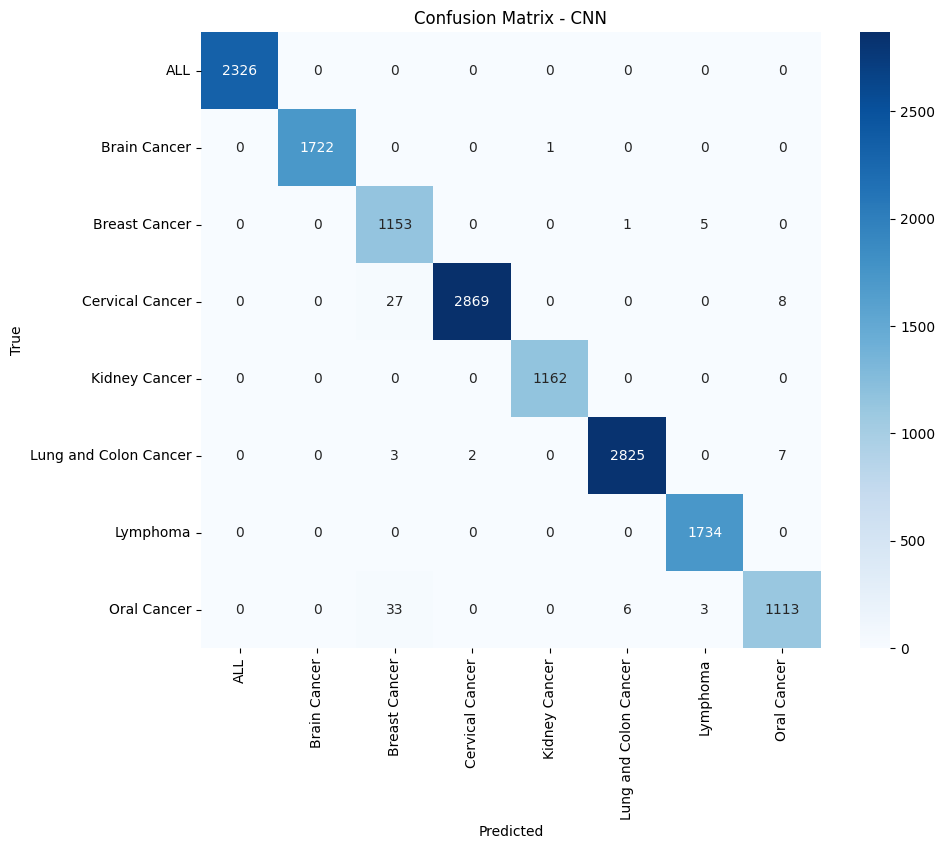


Confusion Matrix for MobileNetV2:
469/469 ━━━━━━━━━━━━━━━━━━━━ 54s 115ms/step


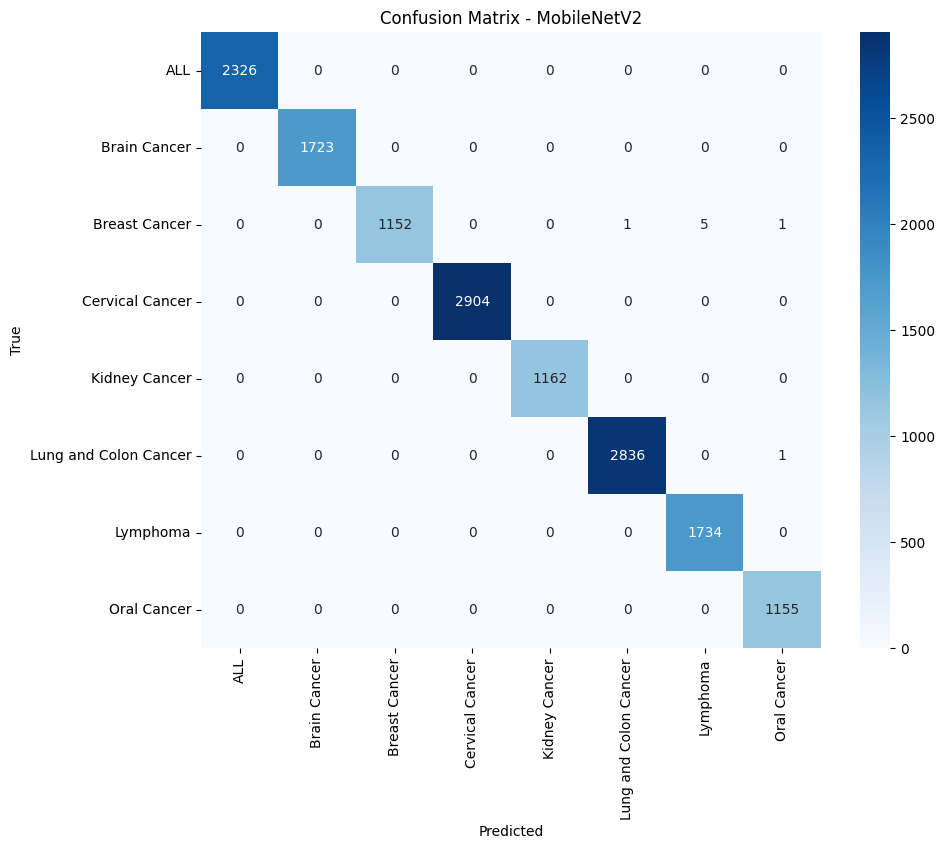


Confusion Matrix for ResNet50:
469/469 ━━━━━━━━━━━━━━━━━━━━ 128s 273ms/step


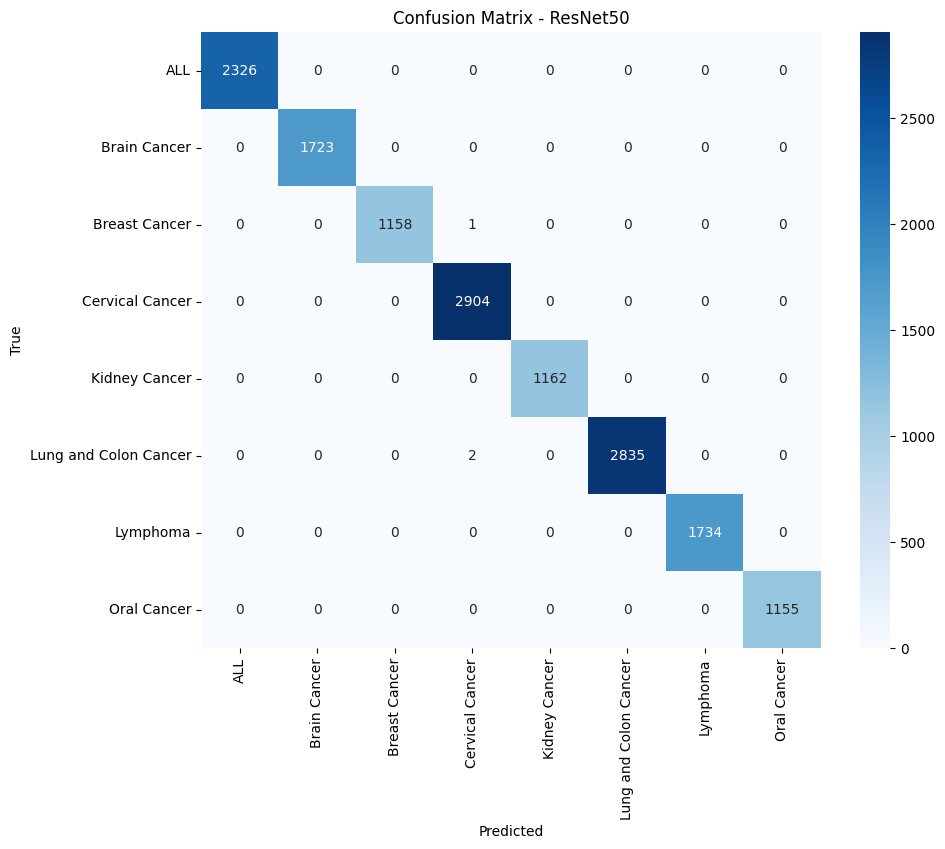

In [83]:
plot_confusion_matrices(models, test_gen_aug, target_names)

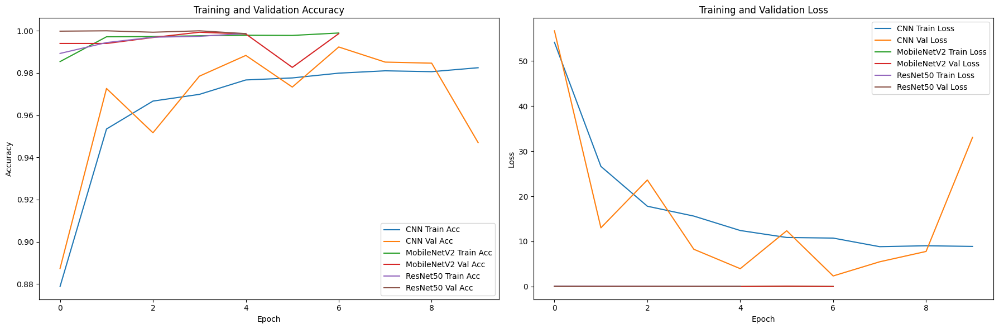

In [84]:
histories = [
    best_summary['cnn']['history'],
    best_summary['mobilenetv2']['history'],
    best_summary['resnet50']['history']
]

model_names = ['CNN', 'MobileNetV2', 'ResNet50']

plot_training_histories(histories, model_names)

469/469 ━━━━━━━━━━━━━━━━━━━━ 23s 49ms/step
469/469 ━━━━━━━━━━━━━━━━━━━━ 61s 124ms/step
469/469 ━━━━━━━━━━━━━━━━━━━━ 134s 281ms/step


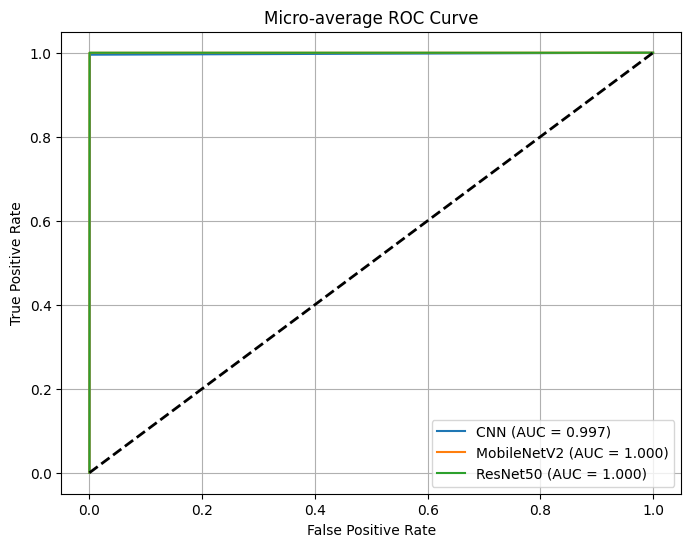

In [85]:
models = [
    load_model(best_summary['cnn']['best_model_path']),
    load_model(best_summary['mobilenetv2']['best_model_path']),
    load_model(best_summary['resnet50']['best_model_path'])
]

model_names = ['CNN', 'MobileNetV2', 'ResNet50']

plot_auc_roc(models, test_gen_aug, model_names)

# 6. SUMMARY
This project addresses multi-class cancer image classification using a custom CNN, MobileNetV2, and ResNet50, trained on 130,002 RGB images across eight cancer types. Exploratory Data Analysis revealed class imbalance and image quality issues, mitigated through blur detection (Laplace Variance, Tenengrad Score), brightness/contrast analysis, and outlier handling. Five experimental stages tested the impact of dataset size, data augmentation, class imbalance handling, and hyperparameter tuning via grid search. The best configurations achieved: CNN — 99.08% test accuracy, 0.0889 loss; MobileNetV2 — 99.30% test accuracy, 0.0473 loss; ResNet50 — 99.45% test accuracy, 0.0406 loss (suspected data leakage). MobileNetV2 proved most robust, excelling with class weights but without augmentation, while CNN benefited from augmentation and class balancing but remained less competitive. Future work includes resolving ResNet50’s potential leakage and further optimizing CNN performance.